# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

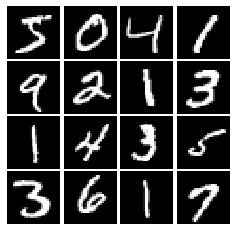

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    x = tf.maximum(x,alpha*x)
    
    return x

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise = tf.random.uniform([batch_size,dim], minval=-1, maxval=1)
    
    return noise

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Dense(256,input_shape=(784,)),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024,input_shape=(noise_dim,)),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation=tf.nn.tanh)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    L_DR = bce(tf.ones_like(logits_real),logits_real)
    L_DF = bce(tf.zeros_like(logits_fake),logits_fake)
    loss = L_DR + L_DF

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones_like(logits_fake),logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.061, G:0.7688
Instructions for updating:
Use tf.identity instead.


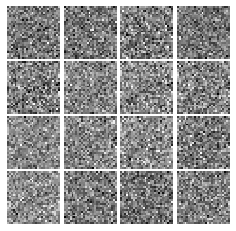

Epoch: 0, Iter: 20, D: 0.6131, G:0.8941


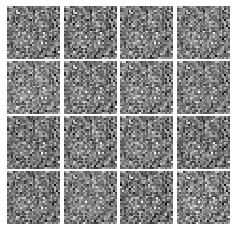

Epoch: 0, Iter: 40, D: 0.4208, G:1.376


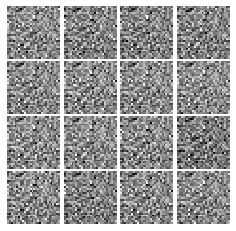

Epoch: 0, Iter: 60, D: 0.1146, G:2.871


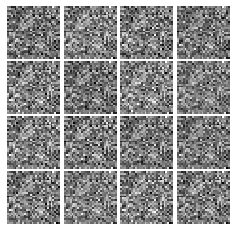

Epoch: 0, Iter: 80, D: 0.04668, G:4.293


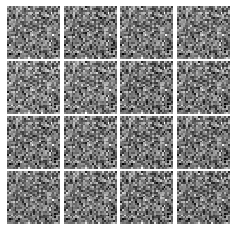

Epoch: 0, Iter: 100, D: 1.999, G:3.726


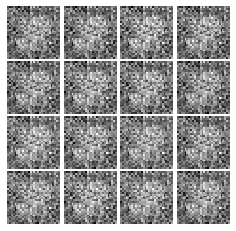

Epoch: 0, Iter: 120, D: 1.259, G:1.397


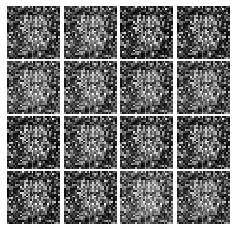

Epoch: 0, Iter: 140, D: 1.34, G:1.193


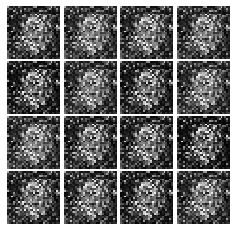

Epoch: 0, Iter: 160, D: 1.928, G:0.3733


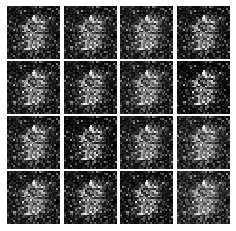

Epoch: 0, Iter: 180, D: 1.133, G:1.023


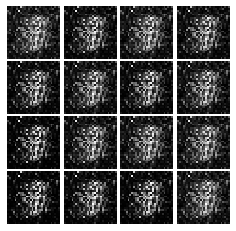

Epoch: 0, Iter: 200, D: 2.893, G:3.132


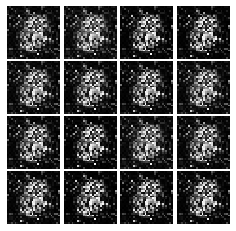

Epoch: 0, Iter: 220, D: 1.197, G:1.314


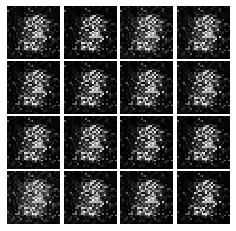

Epoch: 0, Iter: 240, D: 1.592, G:1.015


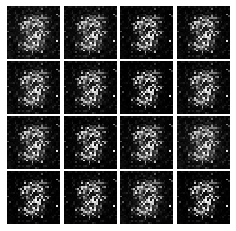

Epoch: 0, Iter: 260, D: 1.149, G:1.444


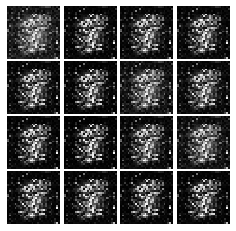

Epoch: 0, Iter: 280, D: 0.8568, G:1.185


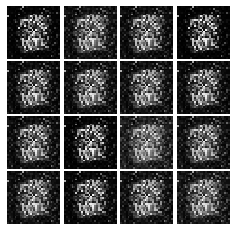

Epoch: 0, Iter: 300, D: 0.7527, G:1.745


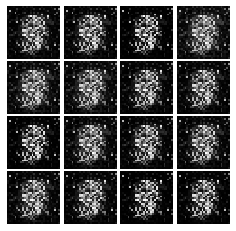

Epoch: 0, Iter: 320, D: 1.56, G:1.091


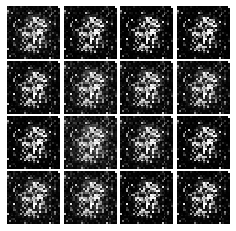

Epoch: 0, Iter: 340, D: 1.259, G:1.427


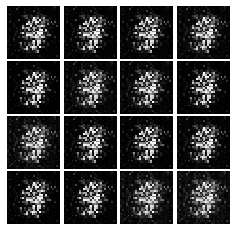

Epoch: 0, Iter: 360, D: 1.433, G:0.9685


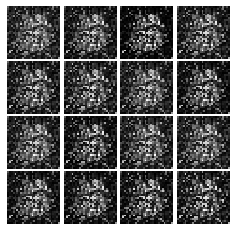

Epoch: 0, Iter: 380, D: 1.165, G:1.398


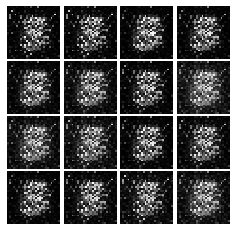

Epoch: 0, Iter: 400, D: 1.239, G:3.015


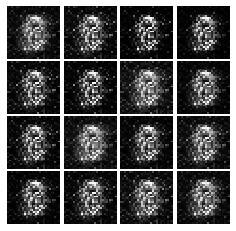

Epoch: 0, Iter: 420, D: 1.381, G:1.087


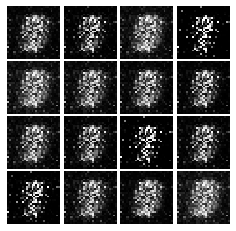

Epoch: 0, Iter: 440, D: 0.8222, G:1.487


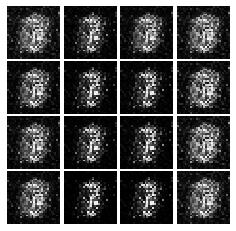

Epoch: 0, Iter: 460, D: 1.345, G:1.558


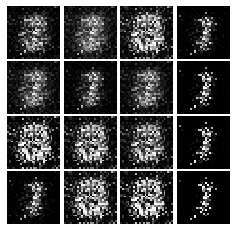

Epoch: 1, Iter: 480, D: 2.194, G:0.551


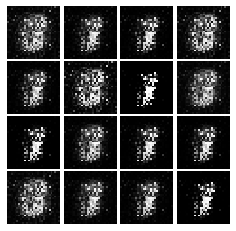

Epoch: 1, Iter: 500, D: 0.9303, G:1.462


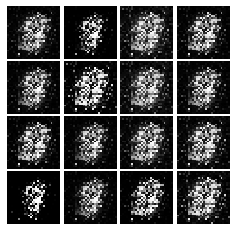

Epoch: 1, Iter: 520, D: 1.221, G:0.9822


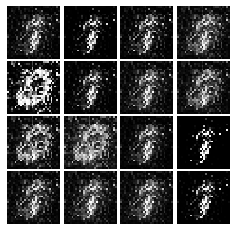

Epoch: 1, Iter: 540, D: 1.105, G:2.049


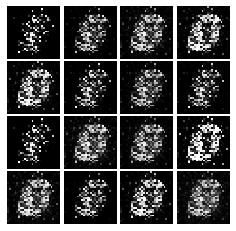

Epoch: 1, Iter: 560, D: 1.609, G:0.8695


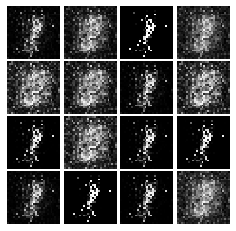

Epoch: 1, Iter: 580, D: 1.43, G:1.498


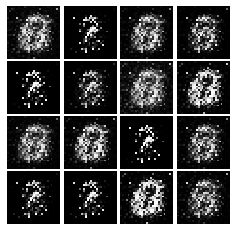

Epoch: 1, Iter: 600, D: 1.216, G:1.036


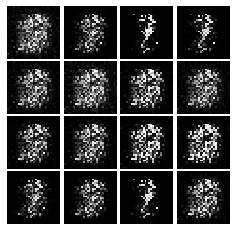

Epoch: 1, Iter: 620, D: 0.9592, G:1.209


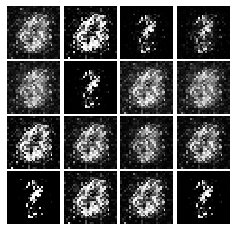

Epoch: 1, Iter: 640, D: 1.269, G:0.9678


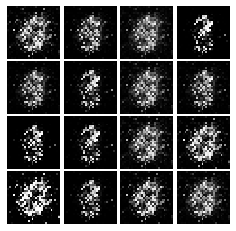

Epoch: 1, Iter: 660, D: 1.1, G:1.233


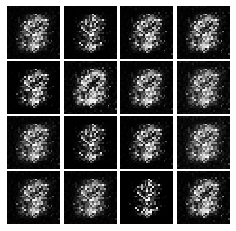

Epoch: 1, Iter: 680, D: 1.611, G:0.1818


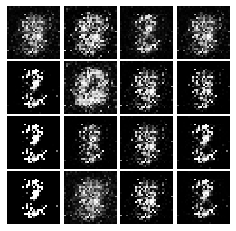

Epoch: 1, Iter: 700, D: 1.153, G:0.9119


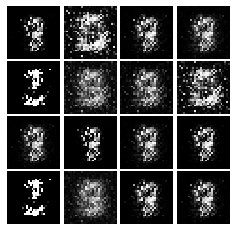

Epoch: 1, Iter: 720, D: 1.092, G:1.466


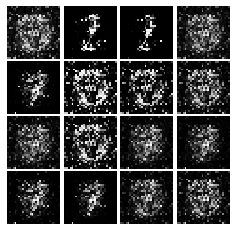

Epoch: 1, Iter: 740, D: 1.18, G:1.086


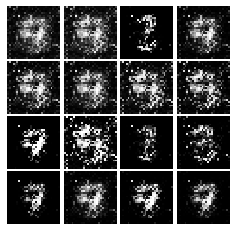

Epoch: 1, Iter: 760, D: 1.195, G:1.236


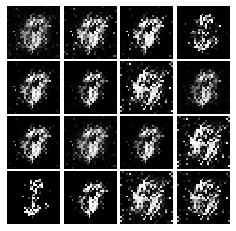

Epoch: 1, Iter: 780, D: 0.7191, G:1.318


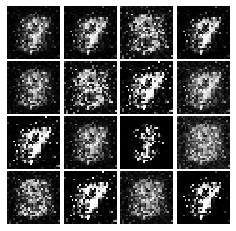

Epoch: 1, Iter: 800, D: 1.134, G:0.8325


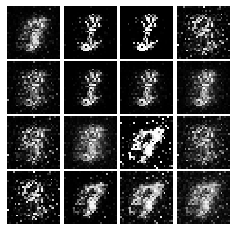

Epoch: 1, Iter: 820, D: 1.317, G:1.106


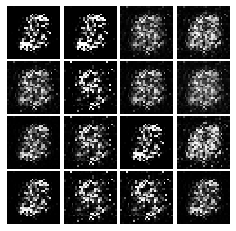

Epoch: 1, Iter: 840, D: 1.203, G:1.087


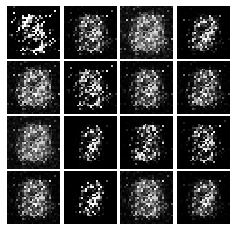

Epoch: 1, Iter: 860, D: 1.49, G:1.105


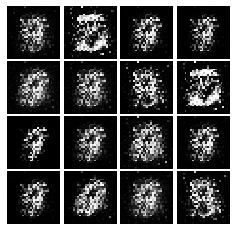

Epoch: 1, Iter: 880, D: 1.269, G:1.07


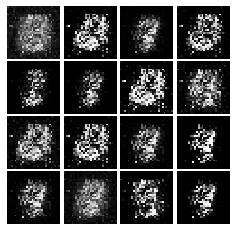

Epoch: 1, Iter: 900, D: 1.37, G:1.013


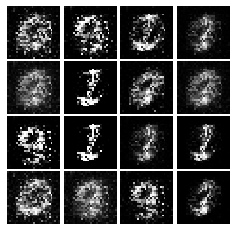

Epoch: 1, Iter: 920, D: 1.179, G:1.002


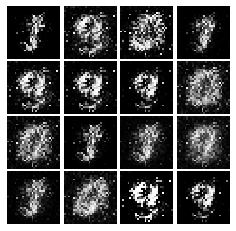

Epoch: 2, Iter: 940, D: 1.456, G:0.9419


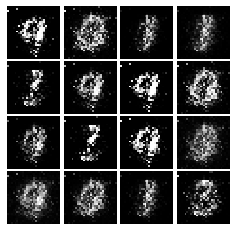

Epoch: 2, Iter: 960, D: 1.312, G:0.8909


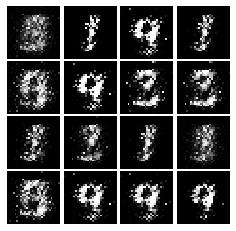

Epoch: 2, Iter: 980, D: 1.224, G:0.8921


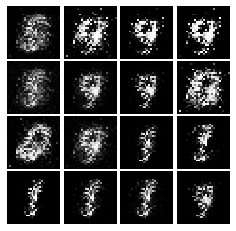

Epoch: 2, Iter: 1000, D: 1.154, G:0.8761


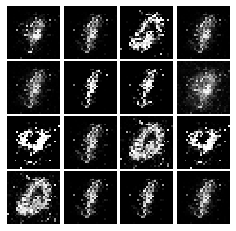

Epoch: 2, Iter: 1020, D: 1.177, G:1.376


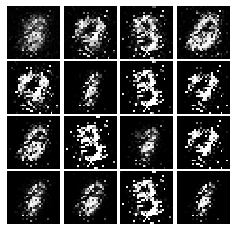

Epoch: 2, Iter: 1040, D: 0.9821, G:1.858


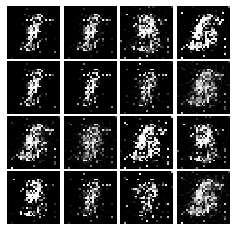

Epoch: 2, Iter: 1060, D: 1.187, G:1.398


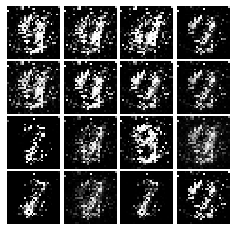

Epoch: 2, Iter: 1080, D: 0.9903, G:2.282


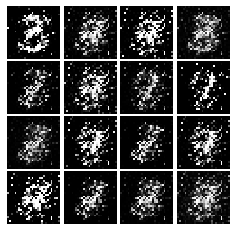

Epoch: 2, Iter: 1100, D: 1.472, G:1.034


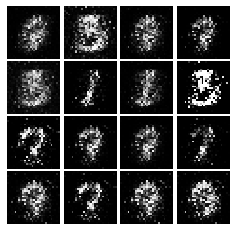

Epoch: 2, Iter: 1120, D: 1.273, G:0.948


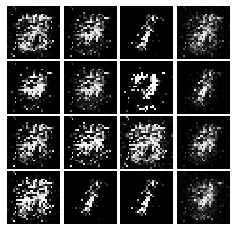

Epoch: 2, Iter: 1140, D: 1.369, G:0.8638


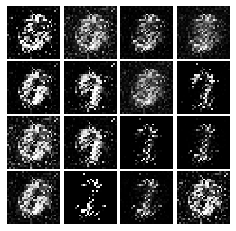

Epoch: 2, Iter: 1160, D: 1.229, G:1.155


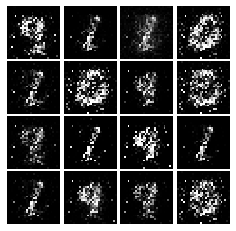

Epoch: 2, Iter: 1180, D: 1.159, G:0.9732


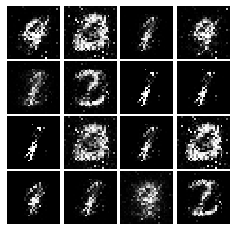

Epoch: 2, Iter: 1200, D: 1.481, G:0.9496


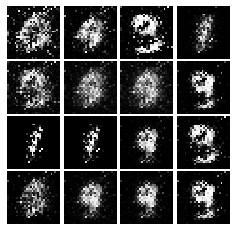

Epoch: 2, Iter: 1220, D: 1.141, G:1.589


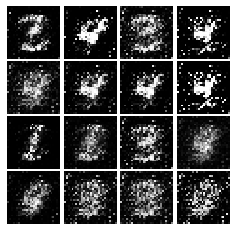

Epoch: 2, Iter: 1240, D: 1.114, G:1.006


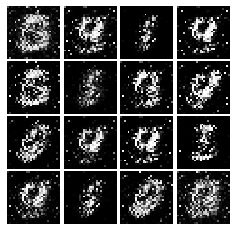

Epoch: 2, Iter: 1260, D: 1.227, G:1.405


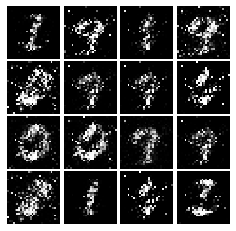

Epoch: 2, Iter: 1280, D: 1.303, G:1.629


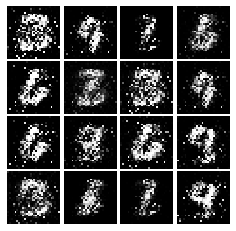

Epoch: 2, Iter: 1300, D: 1.476, G:1.033


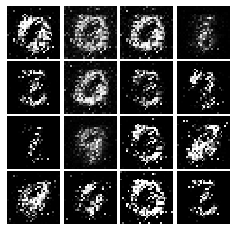

Epoch: 2, Iter: 1320, D: 1.238, G:1.36


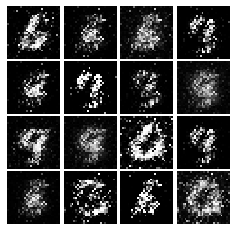

Epoch: 2, Iter: 1340, D: 1.082, G:1.067


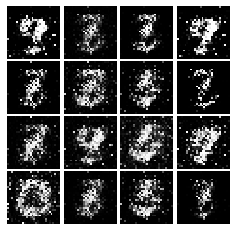

Epoch: 2, Iter: 1360, D: 1.338, G:0.926


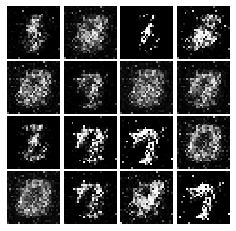

Epoch: 2, Iter: 1380, D: 1.738, G:0.9018


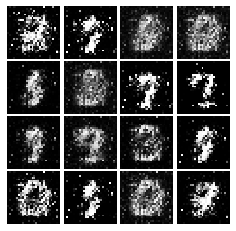

Epoch: 2, Iter: 1400, D: 1.125, G:1.072


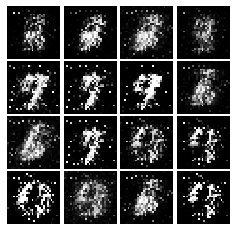

Epoch: 3, Iter: 1420, D: 1.086, G:1.261


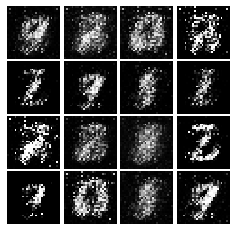

Epoch: 3, Iter: 1440, D: 1.241, G:0.9747


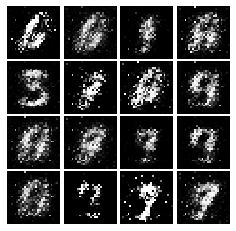

Epoch: 3, Iter: 1460, D: 1.345, G:0.8339


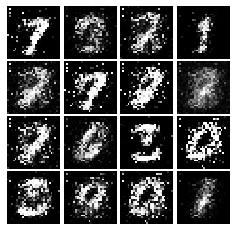

Epoch: 3, Iter: 1480, D: 1.323, G:0.8781


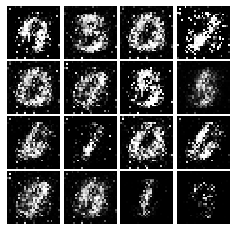

Epoch: 3, Iter: 1500, D: 1.166, G:1.323


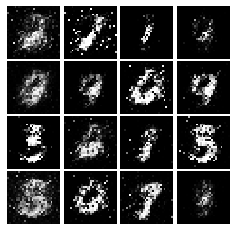

Epoch: 3, Iter: 1520, D: 1.333, G:0.9576


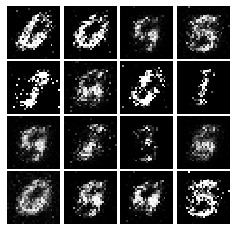

Epoch: 3, Iter: 1540, D: 1.306, G:0.7727


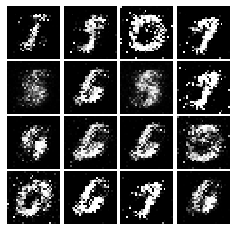

Epoch: 3, Iter: 1560, D: 1.146, G:1.036


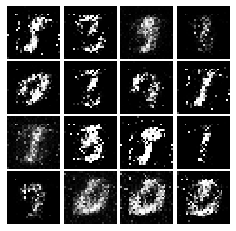

Epoch: 3, Iter: 1580, D: 1.362, G:1.215


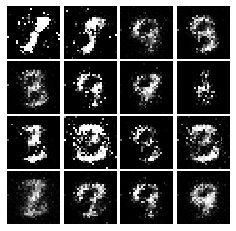

Epoch: 3, Iter: 1600, D: 1.299, G:1.024


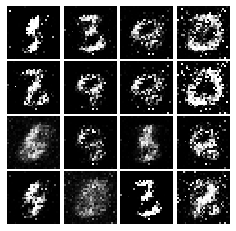

Epoch: 3, Iter: 1620, D: 1.298, G:0.7904


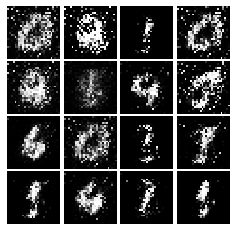

Epoch: 3, Iter: 1640, D: 1.341, G:0.6969


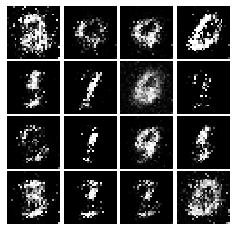

Epoch: 3, Iter: 1660, D: 1.257, G:1.025


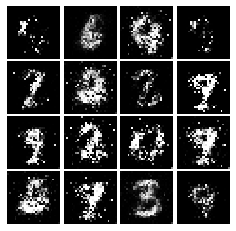

Epoch: 3, Iter: 1680, D: 1.305, G:1.042


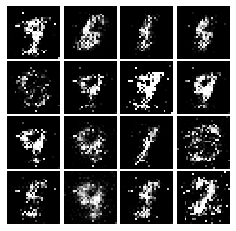

Epoch: 3, Iter: 1700, D: 1.392, G:0.9178


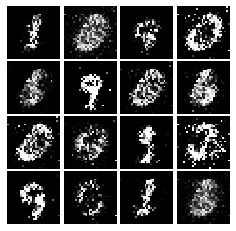

Epoch: 3, Iter: 1720, D: 1.281, G:0.9426


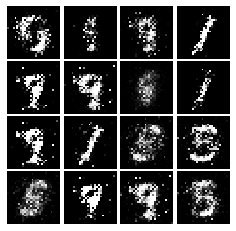

Epoch: 3, Iter: 1740, D: 1.224, G:1.34


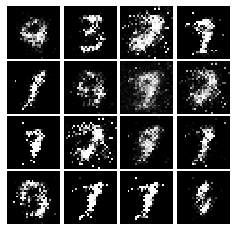

Epoch: 3, Iter: 1760, D: 1.228, G:0.9718


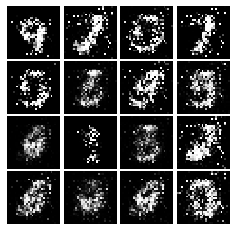

Epoch: 3, Iter: 1780, D: 1.11, G:1.11


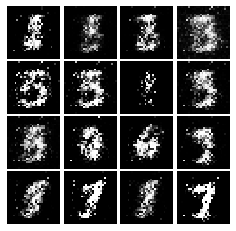

Epoch: 3, Iter: 1800, D: 1.354, G:1.152


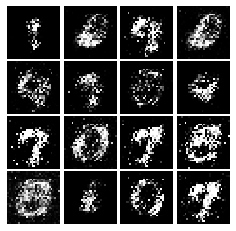

Epoch: 3, Iter: 1820, D: 1.447, G:0.8606


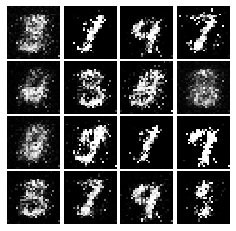

Epoch: 3, Iter: 1840, D: 1.296, G:0.8705


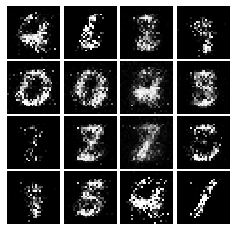

Epoch: 3, Iter: 1860, D: 1.234, G:0.8704


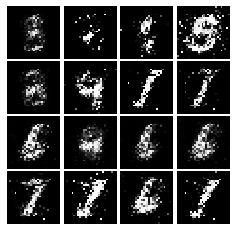

Epoch: 4, Iter: 1880, D: 1.189, G:1.082


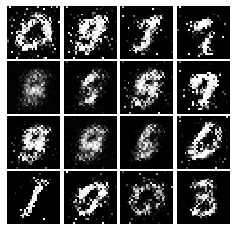

Epoch: 4, Iter: 1900, D: 1.263, G:0.8438


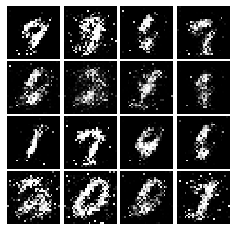

Epoch: 4, Iter: 1920, D: 1.185, G:1.058


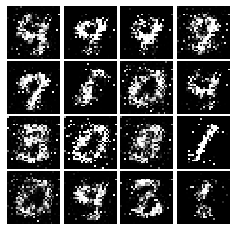

Epoch: 4, Iter: 1940, D: 1.222, G:1.08


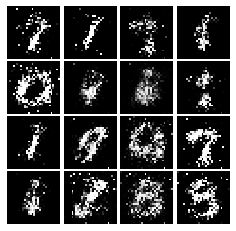

Epoch: 4, Iter: 1960, D: 1.357, G:0.7891


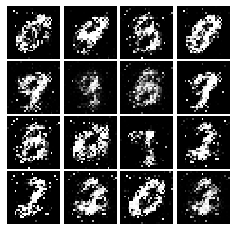

Epoch: 4, Iter: 1980, D: 1.173, G:1.167


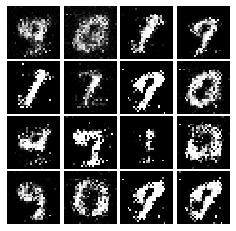

Epoch: 4, Iter: 2000, D: 1.235, G:0.9129


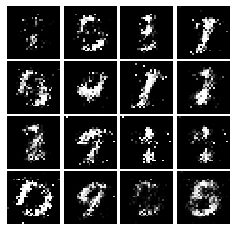

Epoch: 4, Iter: 2020, D: 1.238, G:0.8982


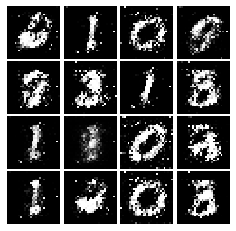

Epoch: 4, Iter: 2040, D: 1.345, G:0.8546


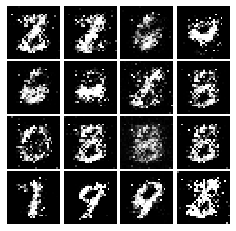

Epoch: 4, Iter: 2060, D: 1.203, G:0.8657


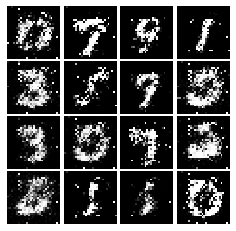

Epoch: 4, Iter: 2080, D: 1.257, G:0.8679


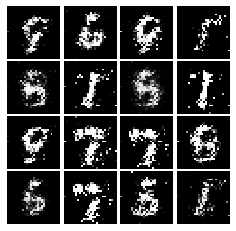

Epoch: 4, Iter: 2100, D: 1.208, G:0.8454


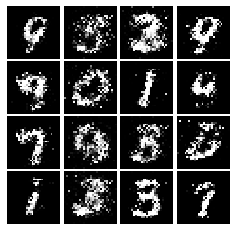

Epoch: 4, Iter: 2120, D: 1.188, G:2.415


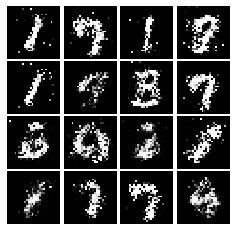

Epoch: 4, Iter: 2140, D: 1.328, G:0.8621


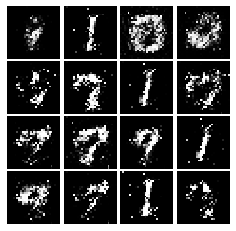

Epoch: 4, Iter: 2160, D: 1.265, G:0.8578


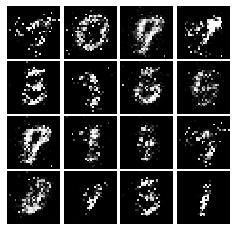

Epoch: 4, Iter: 2180, D: 1.354, G:0.7355


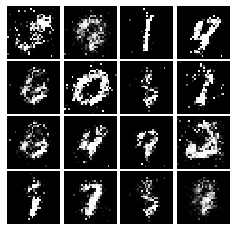

Epoch: 4, Iter: 2200, D: 1.429, G:0.7902


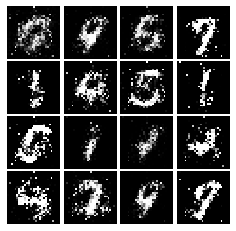

Epoch: 4, Iter: 2220, D: 1.376, G:0.797


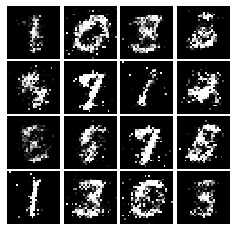

Epoch: 4, Iter: 2240, D: 1.281, G:0.7193


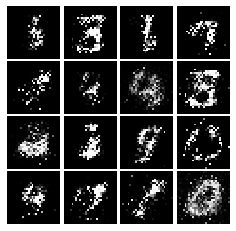

Epoch: 4, Iter: 2260, D: 1.284, G:0.8864


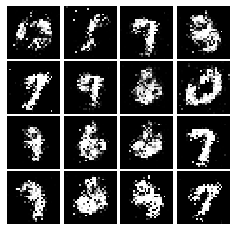

Epoch: 4, Iter: 2280, D: 1.223, G:0.8494


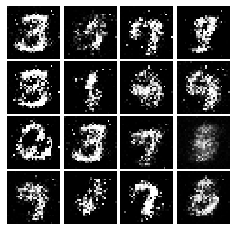

Epoch: 4, Iter: 2300, D: 1.316, G:0.8993


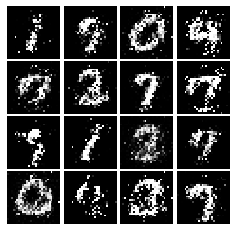

Epoch: 4, Iter: 2320, D: 1.282, G:0.8963


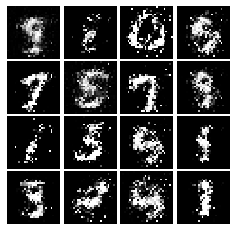

Epoch: 4, Iter: 2340, D: 1.121, G:0.9903


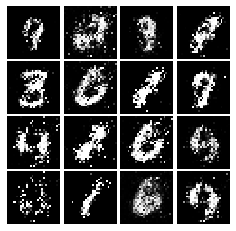

Epoch: 5, Iter: 2360, D: 1.227, G:0.8666


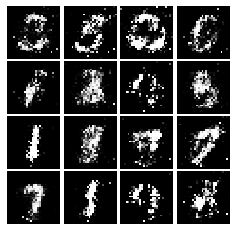

Epoch: 5, Iter: 2380, D: 1.302, G:0.7792


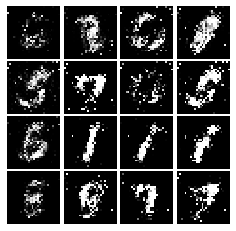

Epoch: 5, Iter: 2400, D: 1.276, G:0.8771


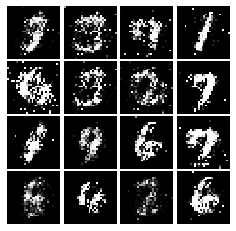

Epoch: 5, Iter: 2420, D: 1.314, G:0.9113


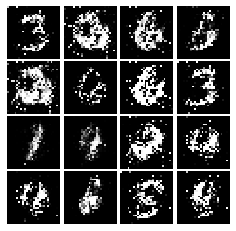

Epoch: 5, Iter: 2440, D: 1.287, G:0.8416


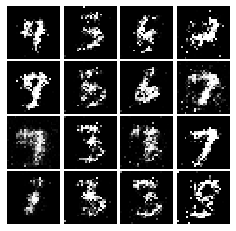

Epoch: 5, Iter: 2460, D: 1.218, G:0.9528


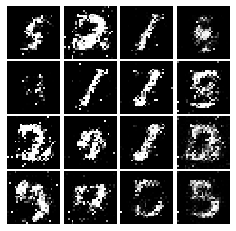

Epoch: 5, Iter: 2480, D: 1.253, G:0.8421


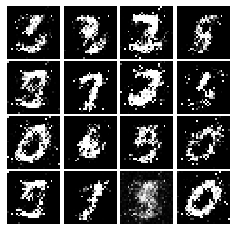

Epoch: 5, Iter: 2500, D: 1.17, G:0.9512


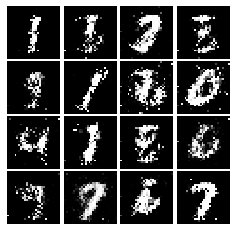

Epoch: 5, Iter: 2520, D: 1.44, G:0.8763


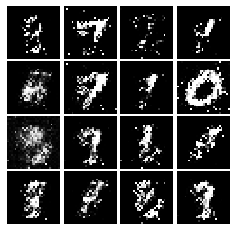

Epoch: 5, Iter: 2540, D: 1.225, G:1.039


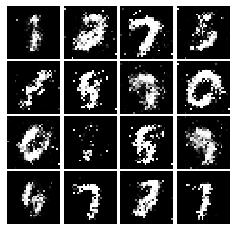

Epoch: 5, Iter: 2560, D: 1.348, G:0.9262


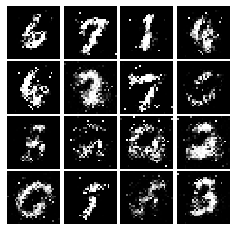

Epoch: 5, Iter: 2580, D: 1.224, G:0.8193


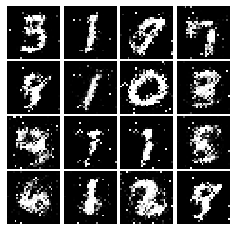

Epoch: 5, Iter: 2600, D: 1.374, G:0.8196


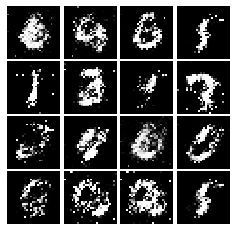

Epoch: 5, Iter: 2620, D: 1.282, G:0.9392


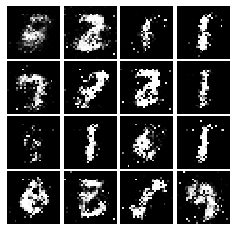

Epoch: 5, Iter: 2640, D: 1.184, G:0.9293


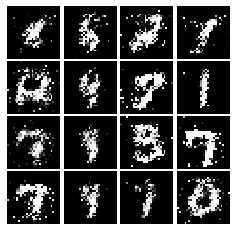

Epoch: 5, Iter: 2660, D: 1.288, G:1.0


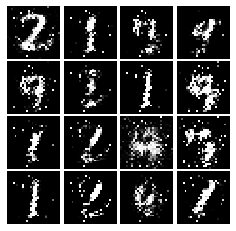

Epoch: 5, Iter: 2680, D: 1.362, G:0.8242


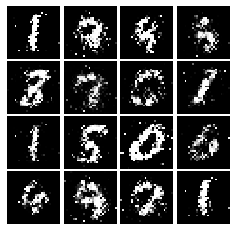

Epoch: 5, Iter: 2700, D: 1.324, G:0.8433


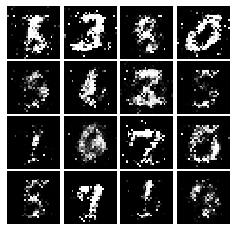

Epoch: 5, Iter: 2720, D: 1.275, G:1.029


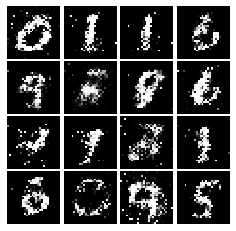

Epoch: 5, Iter: 2740, D: 1.271, G:0.8722


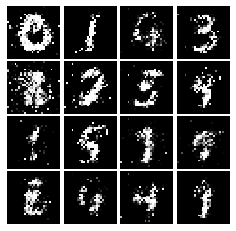

Epoch: 5, Iter: 2760, D: 1.356, G:0.8459


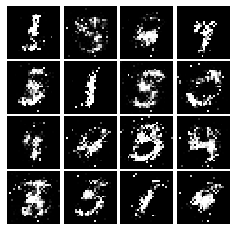

Epoch: 5, Iter: 2780, D: 1.321, G:0.7875


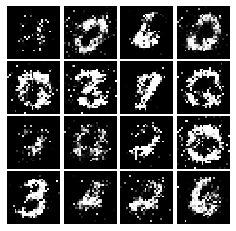

Epoch: 5, Iter: 2800, D: 1.37, G:1.036


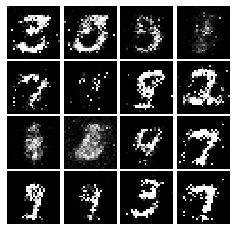

Epoch: 6, Iter: 2820, D: 1.227, G:0.8406


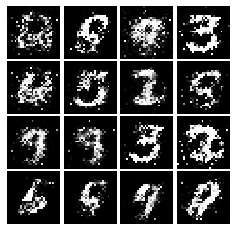

Epoch: 6, Iter: 2840, D: 1.353, G:0.8655


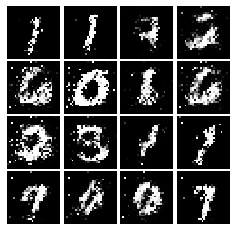

Epoch: 6, Iter: 2860, D: 1.249, G:0.9129


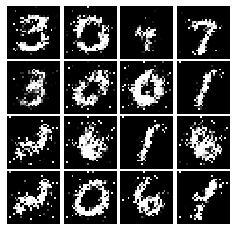

Epoch: 6, Iter: 2880, D: 1.315, G:0.8255


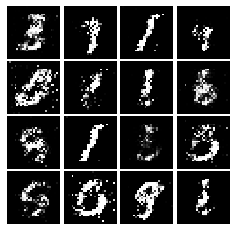

Epoch: 6, Iter: 2900, D: 1.315, G:0.909


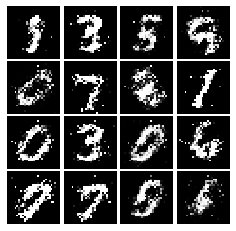

Epoch: 6, Iter: 2920, D: 1.407, G:0.8484


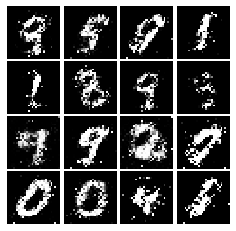

Epoch: 6, Iter: 2940, D: 1.311, G:1.069


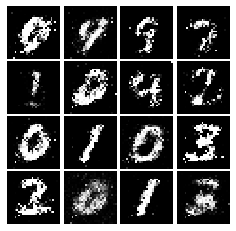

Epoch: 6, Iter: 2960, D: 1.245, G:0.8703


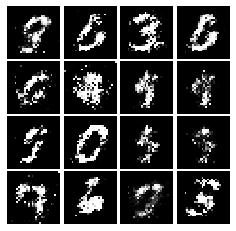

Epoch: 6, Iter: 2980, D: 1.442, G:0.7706


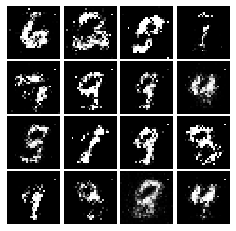

Epoch: 6, Iter: 3000, D: 1.339, G:0.8879


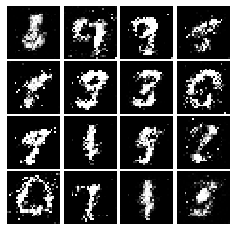

Epoch: 6, Iter: 3020, D: 1.36, G:0.787


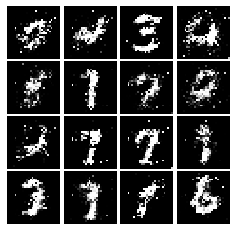

Epoch: 6, Iter: 3040, D: 1.372, G:0.973


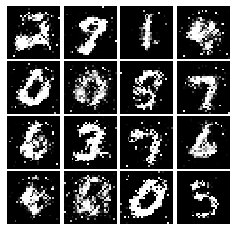

Epoch: 6, Iter: 3060, D: 1.35, G:0.7543


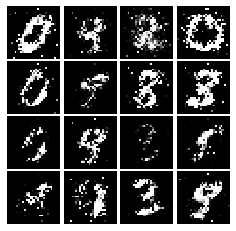

Epoch: 6, Iter: 3080, D: 1.39, G:0.9499


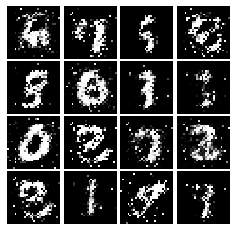

Epoch: 6, Iter: 3100, D: 1.272, G:0.7073


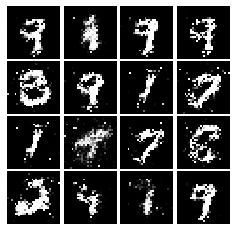

Epoch: 6, Iter: 3120, D: 1.279, G:0.8555


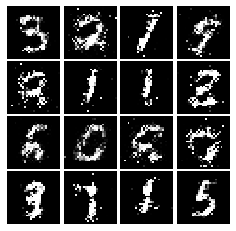

Epoch: 6, Iter: 3140, D: 1.307, G:0.7779


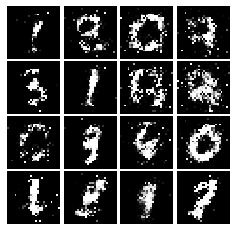

Epoch: 6, Iter: 3160, D: 1.245, G:0.8021


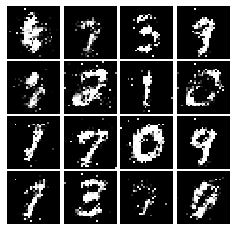

Epoch: 6, Iter: 3180, D: 1.249, G:0.8082


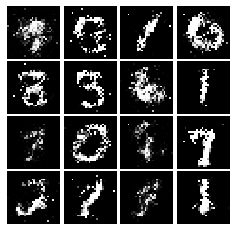

Epoch: 6, Iter: 3200, D: 1.248, G:1.05


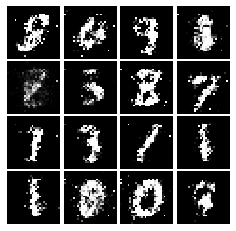

Epoch: 6, Iter: 3220, D: 1.249, G:2.034


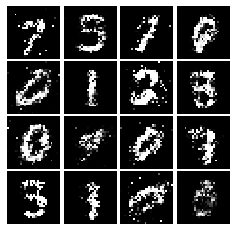

Epoch: 6, Iter: 3240, D: 1.274, G:0.8165


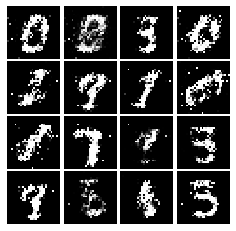

Epoch: 6, Iter: 3260, D: 1.284, G:0.9686


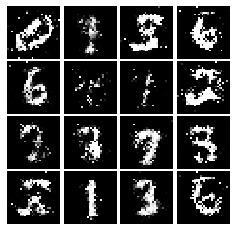

Epoch: 6, Iter: 3280, D: 1.299, G:0.9436


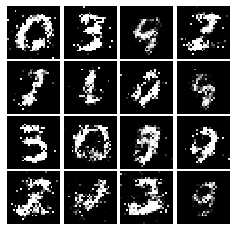

Epoch: 7, Iter: 3300, D: 1.333, G:0.9328


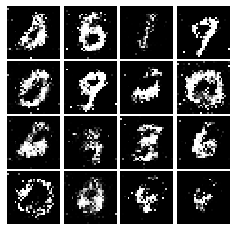

Epoch: 7, Iter: 3320, D: 1.344, G:0.8793


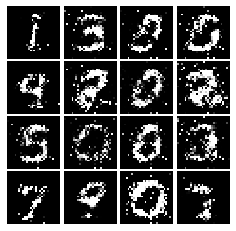

Epoch: 7, Iter: 3340, D: 1.286, G:0.8414


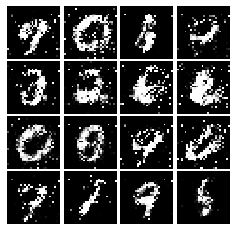

Epoch: 7, Iter: 3360, D: 1.403, G:0.8767


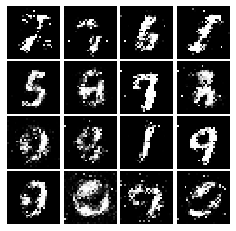

Epoch: 7, Iter: 3380, D: 1.338, G:0.9218


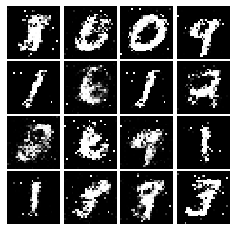

Epoch: 7, Iter: 3400, D: 1.316, G:0.9136


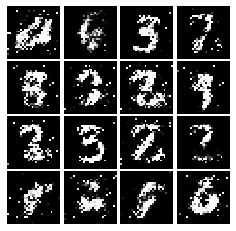

Epoch: 7, Iter: 3420, D: 1.268, G:0.773


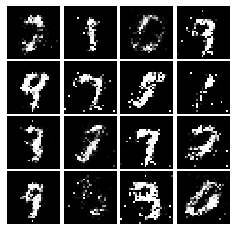

Epoch: 7, Iter: 3440, D: 1.245, G:0.8831


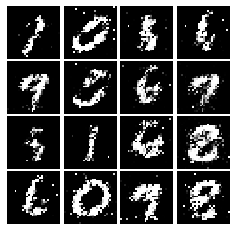

Epoch: 7, Iter: 3460, D: 1.258, G:0.7975


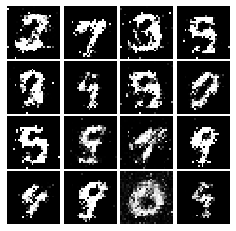

Epoch: 7, Iter: 3480, D: 1.33, G:0.7766


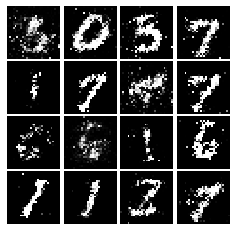

Epoch: 7, Iter: 3500, D: 1.324, G:0.8545


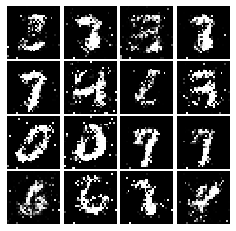

Epoch: 7, Iter: 3520, D: 1.328, G:0.8477


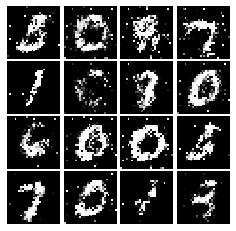

Epoch: 7, Iter: 3540, D: 1.319, G:0.8113


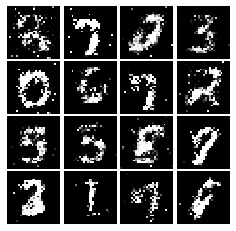

Epoch: 7, Iter: 3560, D: 1.31, G:0.7885


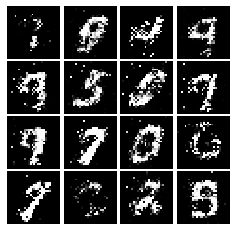

Epoch: 7, Iter: 3580, D: 1.216, G:0.7277


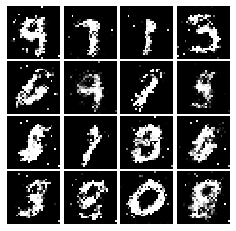

Epoch: 7, Iter: 3600, D: 1.313, G:0.8043


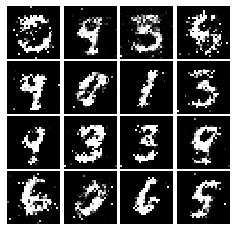

Epoch: 7, Iter: 3620, D: 1.335, G:0.8301


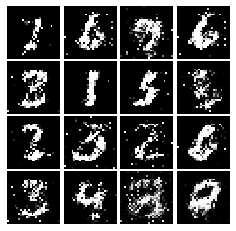

Epoch: 7, Iter: 3640, D: 1.264, G:0.8258


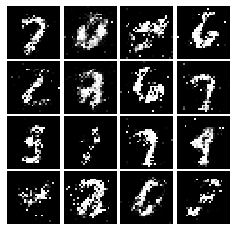

Epoch: 7, Iter: 3660, D: 1.45, G:0.7738


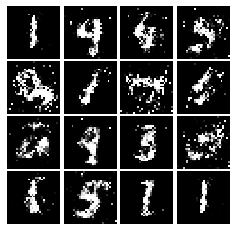

Epoch: 7, Iter: 3680, D: 1.302, G:0.9187


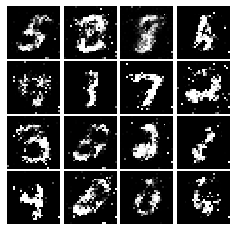

Epoch: 7, Iter: 3700, D: 1.324, G:0.8149


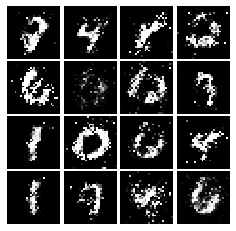

Epoch: 7, Iter: 3720, D: 1.37, G:0.8926


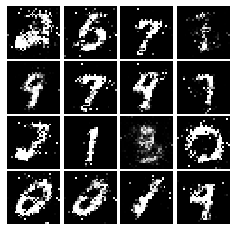

Epoch: 7, Iter: 3740, D: 1.392, G:0.794


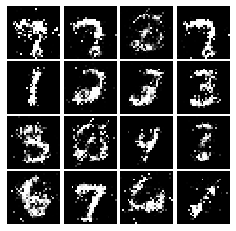

Epoch: 8, Iter: 3760, D: 1.318, G:0.8223


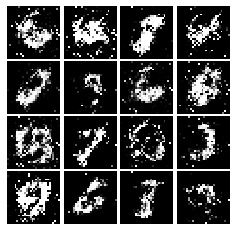

Epoch: 8, Iter: 3780, D: 1.332, G:0.8236


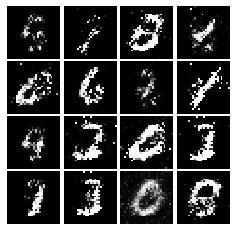

Epoch: 8, Iter: 3800, D: 1.421, G:0.8427


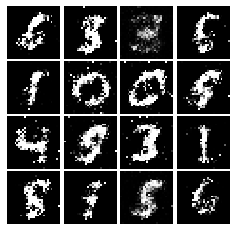

Epoch: 8, Iter: 3820, D: 1.335, G:0.862


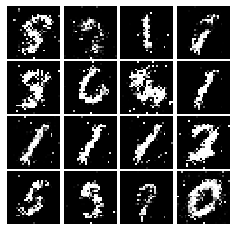

Epoch: 8, Iter: 3840, D: 1.4, G:0.9257


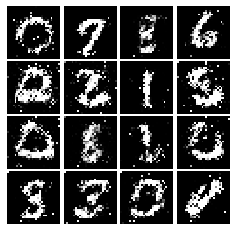

Epoch: 8, Iter: 3860, D: 1.264, G:0.8838


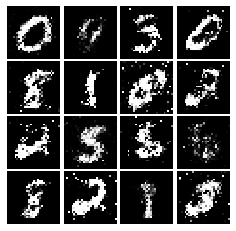

Epoch: 8, Iter: 3880, D: 1.4, G:0.7834


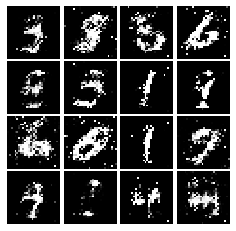

Epoch: 8, Iter: 3900, D: 1.366, G:0.8348


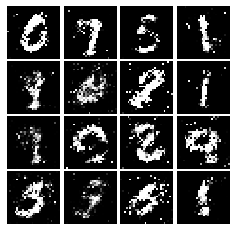

Epoch: 8, Iter: 3920, D: 1.284, G:0.8379


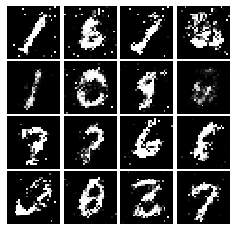

Epoch: 8, Iter: 3940, D: 1.398, G:0.7796


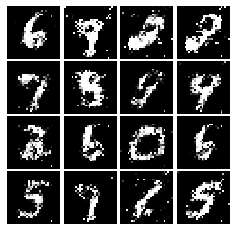

Epoch: 8, Iter: 3960, D: 1.274, G:0.7916


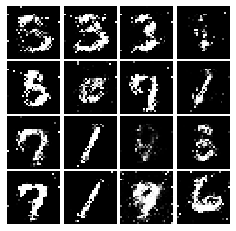

Epoch: 8, Iter: 3980, D: 1.333, G:0.7779


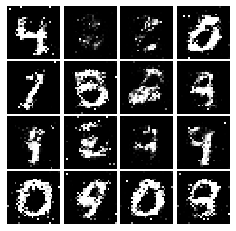

Epoch: 8, Iter: 4000, D: 1.335, G:0.7754


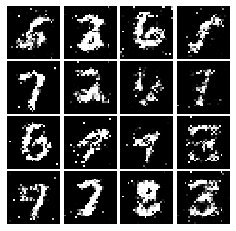

Epoch: 8, Iter: 4020, D: 1.414, G:0.6916


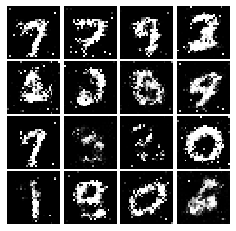

Epoch: 8, Iter: 4040, D: 1.3, G:0.7936


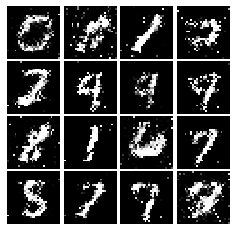

Epoch: 8, Iter: 4060, D: 1.311, G:0.7774


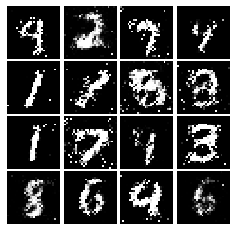

Epoch: 8, Iter: 4080, D: 1.31, G:0.7318


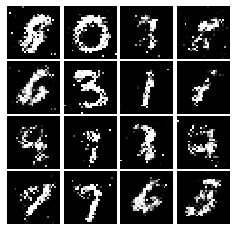

Epoch: 8, Iter: 4100, D: 1.377, G:0.8171


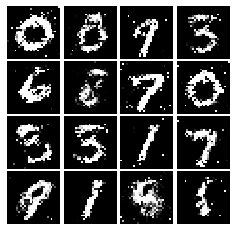

Epoch: 8, Iter: 4120, D: 1.303, G:0.8209


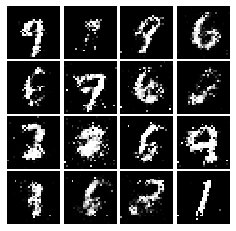

Epoch: 8, Iter: 4140, D: 1.296, G:0.6869


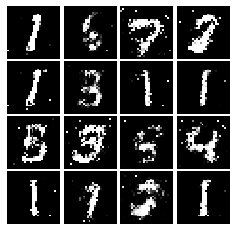

Epoch: 8, Iter: 4160, D: 1.38, G:0.8341


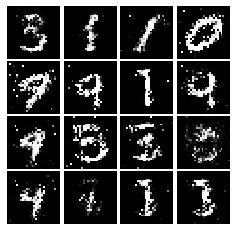

Epoch: 8, Iter: 4180, D: 1.391, G:0.809


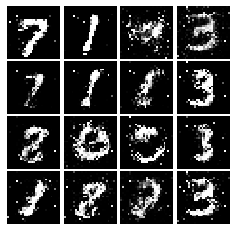

Epoch: 8, Iter: 4200, D: 1.325, G:0.8301


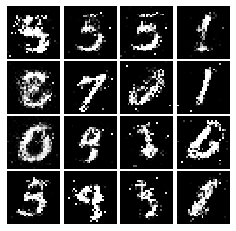

Epoch: 8, Iter: 4220, D: 1.42, G:0.759


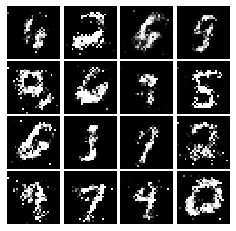

Epoch: 9, Iter: 4240, D: 1.392, G:0.7351


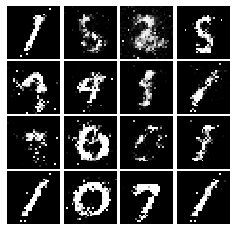

Epoch: 9, Iter: 4260, D: 1.358, G:0.7812


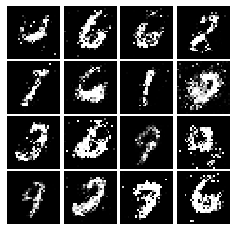

Epoch: 9, Iter: 4280, D: 1.316, G:0.855


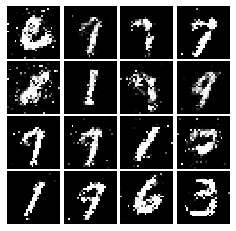

Epoch: 9, Iter: 4300, D: 1.31, G:0.8083


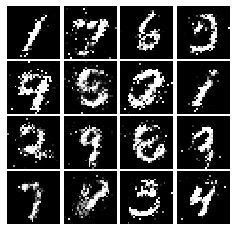

Epoch: 9, Iter: 4320, D: 1.393, G:0.8306


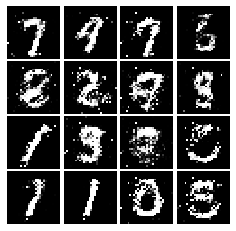

Epoch: 9, Iter: 4340, D: 1.33, G:0.9342


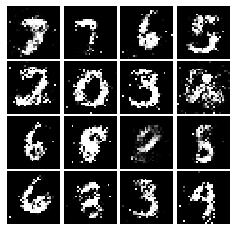

Epoch: 9, Iter: 4360, D: 1.304, G:0.7601


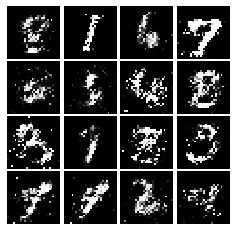

Epoch: 9, Iter: 4380, D: 1.396, G:0.8103


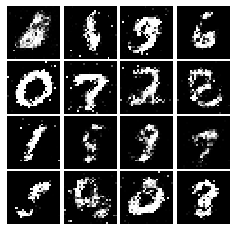

Epoch: 9, Iter: 4400, D: 1.298, G:0.8559


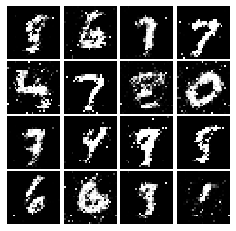

Epoch: 9, Iter: 4420, D: 1.352, G:0.7366


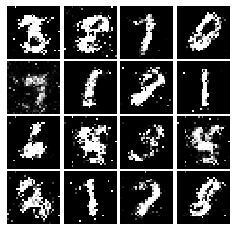

Epoch: 9, Iter: 4440, D: 1.36, G:0.784


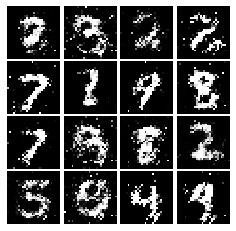

Epoch: 9, Iter: 4460, D: 1.395, G:0.6944


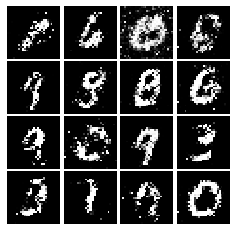

Epoch: 9, Iter: 4480, D: 1.342, G:0.8748


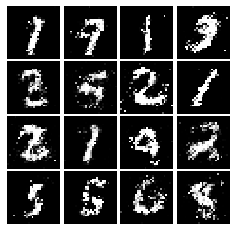

Epoch: 9, Iter: 4500, D: 1.432, G:0.7514


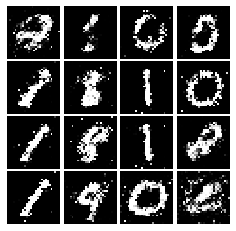

Epoch: 9, Iter: 4520, D: 1.268, G:0.8773


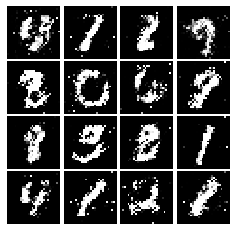

Epoch: 9, Iter: 4540, D: 1.382, G:0.8032


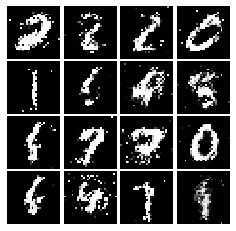

Epoch: 9, Iter: 4560, D: 1.317, G:0.7871


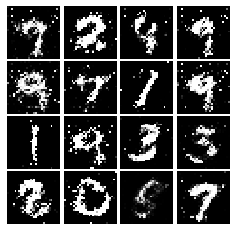

Epoch: 9, Iter: 4580, D: 1.366, G:0.9313


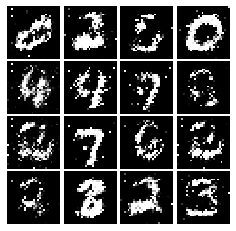

Epoch: 9, Iter: 4600, D: 1.345, G:0.7906


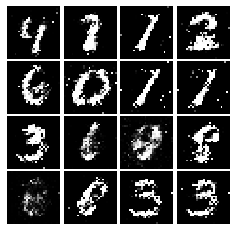

Epoch: 9, Iter: 4620, D: 1.365, G:0.7486


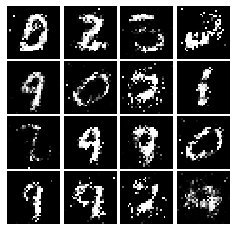

Epoch: 9, Iter: 4640, D: 1.38, G:0.7638


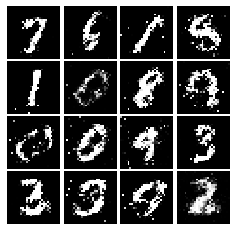

Epoch: 9, Iter: 4660, D: 1.372, G:0.6944


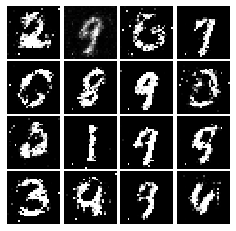

Epoch: 9, Iter: 4680, D: 1.363, G:0.8025


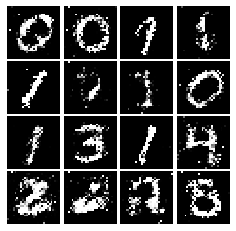

Final images


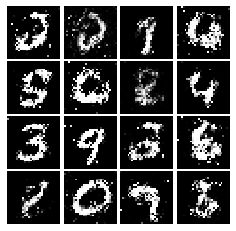

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [21]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.reduce_mean(0.5*(scores_real-1)**2)+tf.reduce_mean(0.5*(scores_fake)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = tf.reduce_mean(0.5*(scores_fake-1)**2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [22]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.6733, G:0.6162


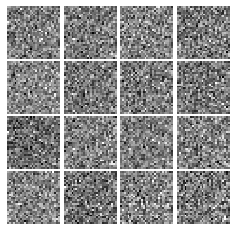

Epoch: 0, Iter: 20, D: 0.1218, G:0.6921


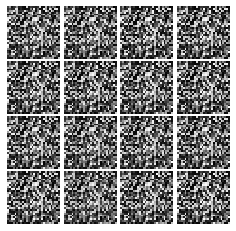

Epoch: 0, Iter: 40, D: 0.02457, G:1.263


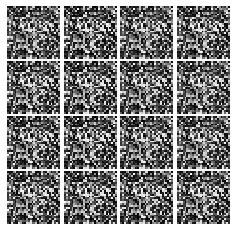

Epoch: 0, Iter: 60, D: 0.02951, G:0.6984


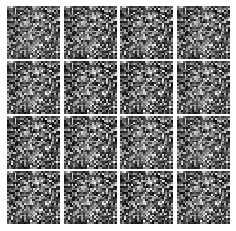

Epoch: 0, Iter: 80, D: 0.04303, G:0.5954


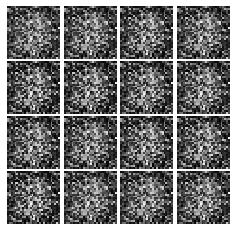

Epoch: 0, Iter: 100, D: 0.3899, G:1.478


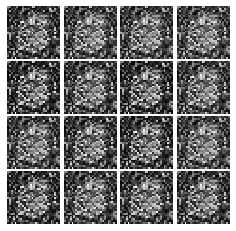

Epoch: 0, Iter: 120, D: 0.888, G:1.743


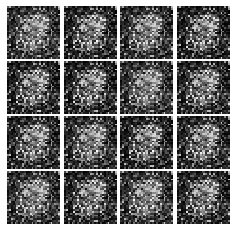

Epoch: 0, Iter: 140, D: 0.431, G:1.438


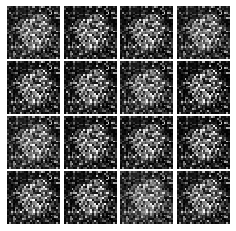

Epoch: 0, Iter: 160, D: 0.3353, G:0.8702


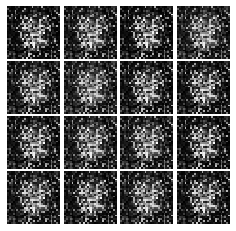

Epoch: 0, Iter: 180, D: 0.1666, G:0.4349


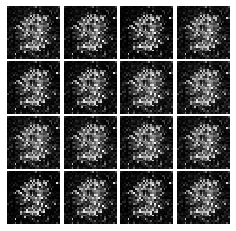

Epoch: 0, Iter: 200, D: 0.3673, G:1.02


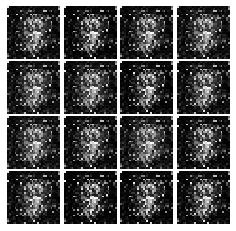

Epoch: 0, Iter: 220, D: 0.2556, G:0.3058


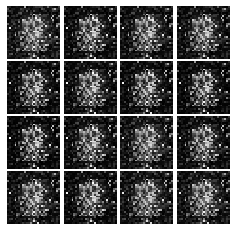

Epoch: 0, Iter: 240, D: 0.1326, G:0.3422


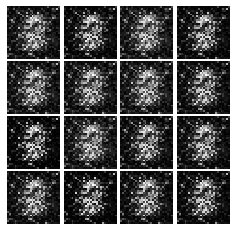

Epoch: 0, Iter: 260, D: 0.2316, G:0.2271


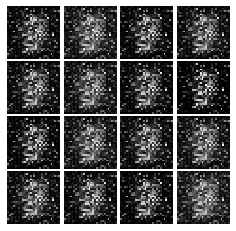

Epoch: 0, Iter: 280, D: 0.4414, G:0.8583


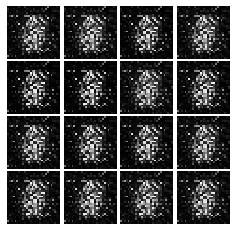

Epoch: 0, Iter: 300, D: 0.08824, G:0.5036


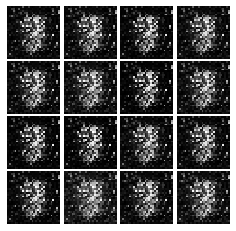

Epoch: 0, Iter: 320, D: 0.164, G:0.3151


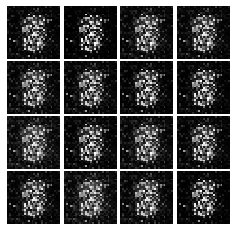

Epoch: 0, Iter: 340, D: 0.1459, G:0.27


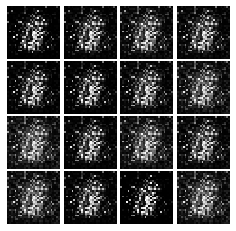

Epoch: 0, Iter: 360, D: 0.1198, G:0.4344


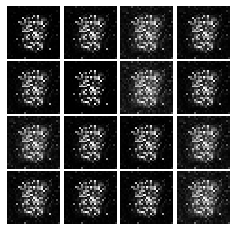

Epoch: 0, Iter: 380, D: 0.08752, G:0.7396


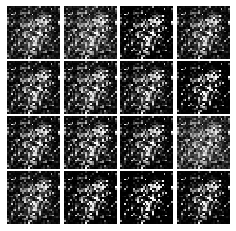

Epoch: 0, Iter: 400, D: 0.3826, G:1.261


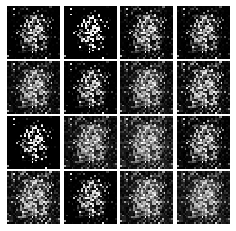

Epoch: 0, Iter: 420, D: 0.2275, G:0.316


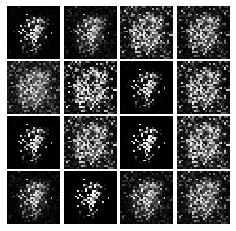

Epoch: 0, Iter: 440, D: 0.1384, G:0.3518


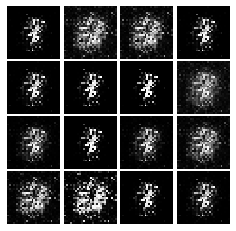

Epoch: 0, Iter: 460, D: 0.0923, G:0.4641


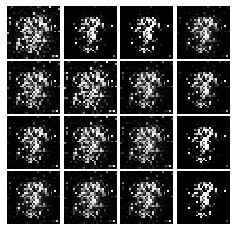

Epoch: 1, Iter: 480, D: 0.1969, G:0.4269


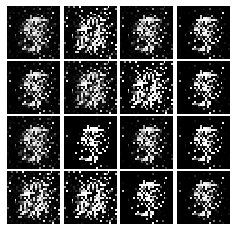

Epoch: 1, Iter: 500, D: 0.08771, G:0.4817


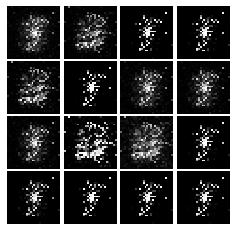

Epoch: 1, Iter: 520, D: 0.292, G:0.8979


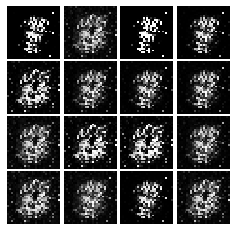

Epoch: 1, Iter: 540, D: 0.1133, G:0.5117


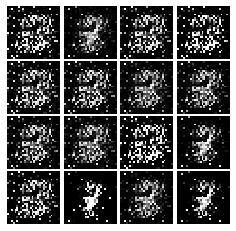

Epoch: 1, Iter: 560, D: 0.07294, G:0.4408


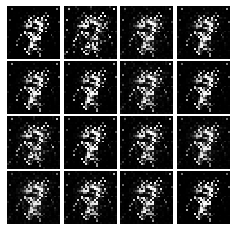

Epoch: 1, Iter: 580, D: 0.06474, G:0.4581


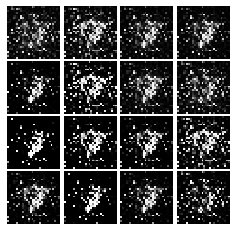

Epoch: 1, Iter: 600, D: 0.135, G:0.2866


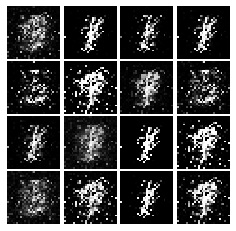

Epoch: 1, Iter: 620, D: 0.09474, G:0.4164


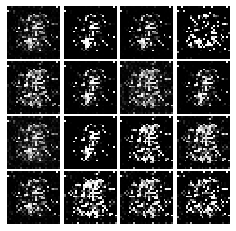

Epoch: 1, Iter: 640, D: 0.1469, G:0.09876


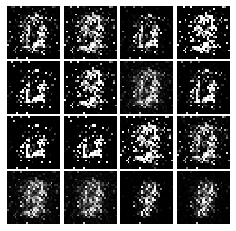

Epoch: 1, Iter: 660, D: 0.1372, G:0.5457


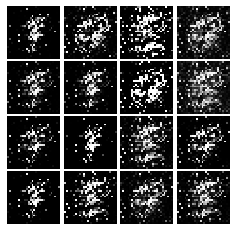

Epoch: 1, Iter: 680, D: 0.2653, G:0.04617


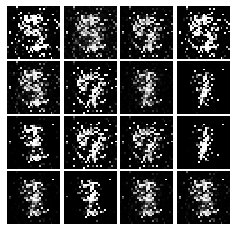

Epoch: 1, Iter: 700, D: 0.1268, G:0.3671


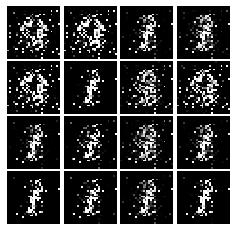

Epoch: 1, Iter: 720, D: 0.1155, G:0.4568


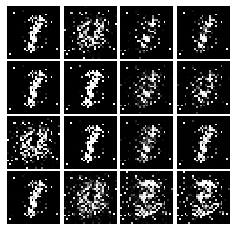

Epoch: 1, Iter: 740, D: 0.1404, G:0.4768


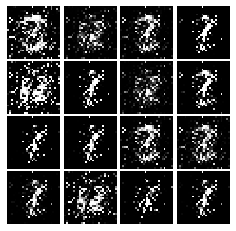

Epoch: 1, Iter: 760, D: 0.1807, G:0.295


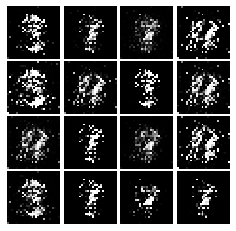

Epoch: 1, Iter: 780, D: 0.09998, G:0.3665


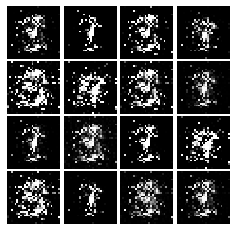

Epoch: 1, Iter: 800, D: 0.208, G:0.2233


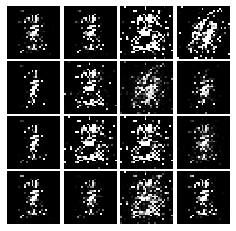

Epoch: 1, Iter: 820, D: 0.07713, G:0.6323


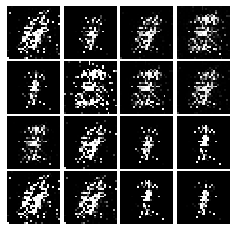

Epoch: 1, Iter: 840, D: 0.06313, G:0.6103


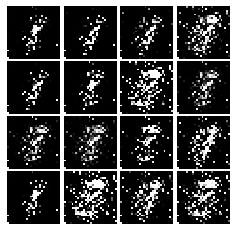

Epoch: 1, Iter: 860, D: 0.1242, G:0.3943


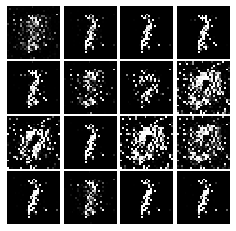

Epoch: 1, Iter: 880, D: 0.09746, G:0.5467


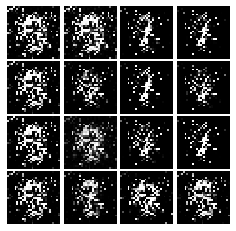

Epoch: 1, Iter: 900, D: 0.06004, G:0.5526


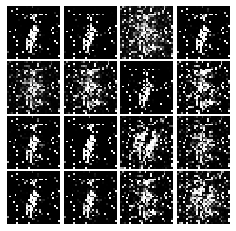

Epoch: 1, Iter: 920, D: 0.1591, G:0.2705


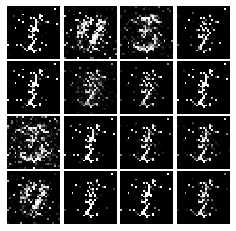

Epoch: 2, Iter: 940, D: 0.1637, G:0.369


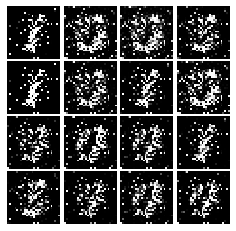

Epoch: 2, Iter: 960, D: 0.08633, G:0.4378


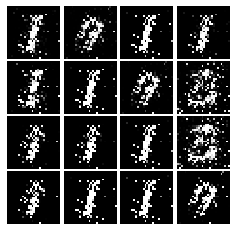

Epoch: 2, Iter: 980, D: 0.1052, G:0.4061


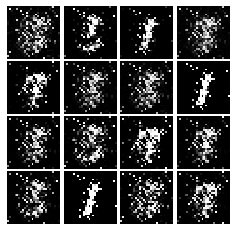

Epoch: 2, Iter: 1000, D: 0.1772, G:0.3801


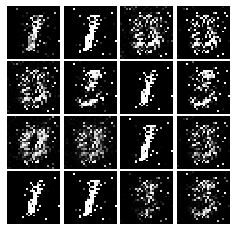

Epoch: 2, Iter: 1020, D: 0.207, G:1.717


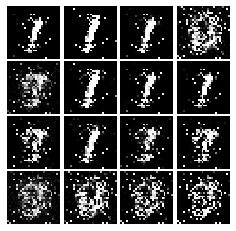

Epoch: 2, Iter: 1040, D: 0.2576, G:0.03181


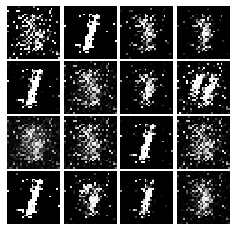

Epoch: 2, Iter: 1060, D: 0.1467, G:0.3699


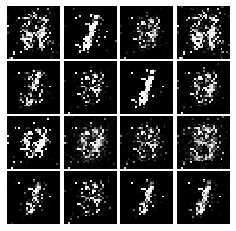

Epoch: 2, Iter: 1080, D: 0.1249, G:0.4521


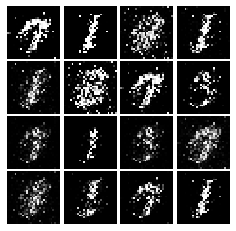

Epoch: 2, Iter: 1100, D: 0.07322, G:0.5329


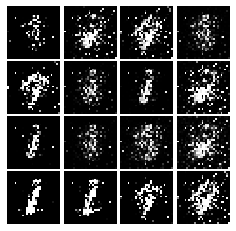

Epoch: 2, Iter: 1120, D: 0.1386, G:0.4289


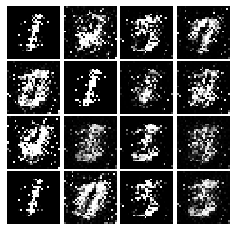

Epoch: 2, Iter: 1140, D: 0.1788, G:0.219


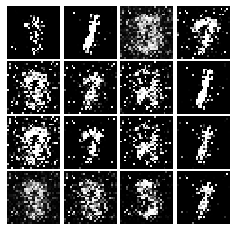

Epoch: 2, Iter: 1160, D: 0.1466, G:0.3316


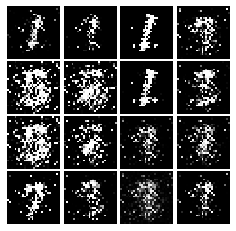

Epoch: 2, Iter: 1180, D: 0.1474, G:0.2905


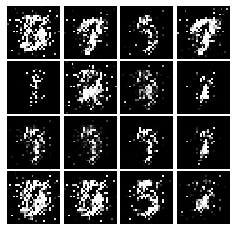

Epoch: 2, Iter: 1200, D: 0.2068, G:0.2527


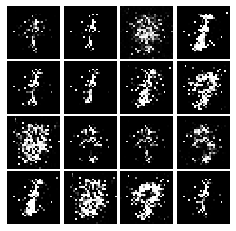

Epoch: 2, Iter: 1220, D: 0.164, G:0.3081


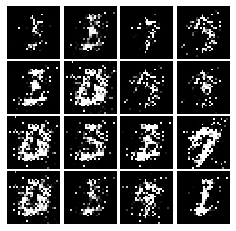

Epoch: 2, Iter: 1240, D: 0.1311, G:0.2728


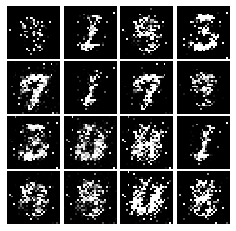

Epoch: 2, Iter: 1260, D: 0.121, G:0.1741


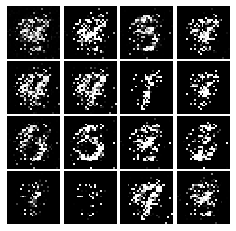

Epoch: 2, Iter: 1280, D: 0.1558, G:0.3524


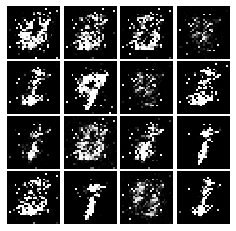

Epoch: 2, Iter: 1300, D: 0.1512, G:0.2273


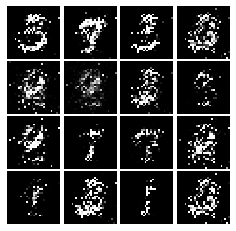

Epoch: 2, Iter: 1320, D: 0.2053, G:0.2902


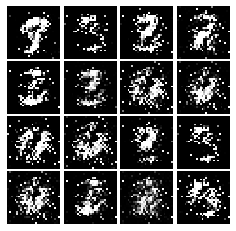

Epoch: 2, Iter: 1340, D: 0.1921, G:0.1818


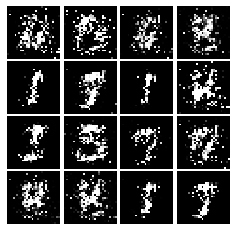

Epoch: 2, Iter: 1360, D: 0.1892, G:0.3759


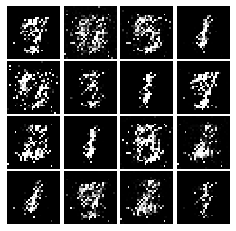

Epoch: 2, Iter: 1380, D: 0.1984, G:0.03981


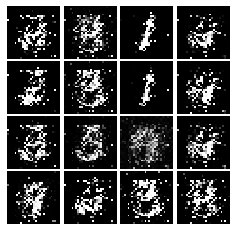

Epoch: 2, Iter: 1400, D: 0.08309, G:0.4304


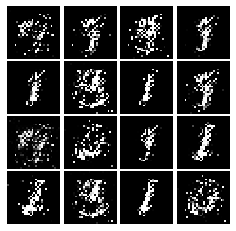

Epoch: 3, Iter: 1420, D: 0.1309, G:0.2415


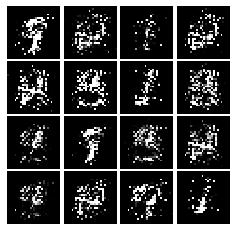

Epoch: 3, Iter: 1440, D: 0.1191, G:0.3817


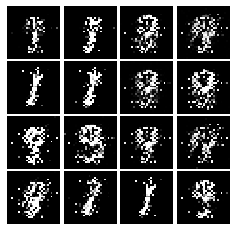

Epoch: 3, Iter: 1460, D: 0.2098, G:0.6566


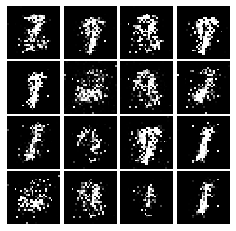

Epoch: 3, Iter: 1480, D: 0.1967, G:0.3139


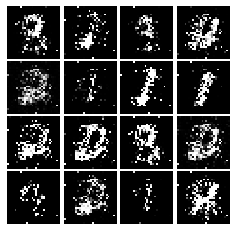

Epoch: 3, Iter: 1500, D: 0.1495, G:0.2613


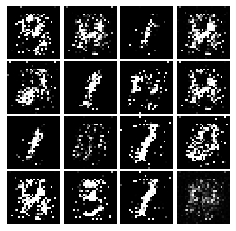

Epoch: 3, Iter: 1520, D: 0.1278, G:0.4903


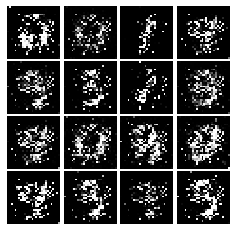

Epoch: 3, Iter: 1540, D: 0.1715, G:0.1799


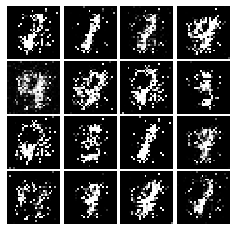

Epoch: 3, Iter: 1560, D: 0.1273, G:0.2732


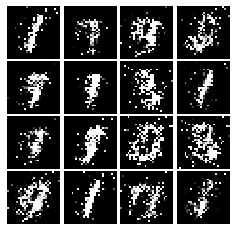

Epoch: 3, Iter: 1580, D: 0.1178, G:0.3439


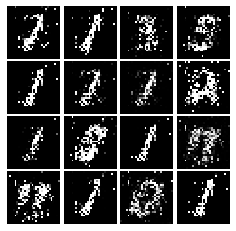

Epoch: 3, Iter: 1600, D: 0.1761, G:0.2673


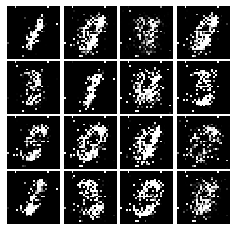

Epoch: 3, Iter: 1620, D: 0.1172, G:0.2939


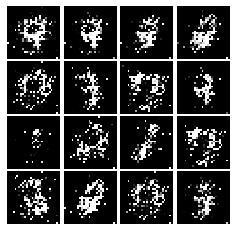

Epoch: 3, Iter: 1640, D: 0.1575, G:0.3061


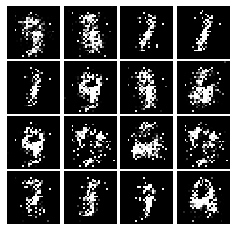

Epoch: 3, Iter: 1660, D: 0.152, G:0.3323


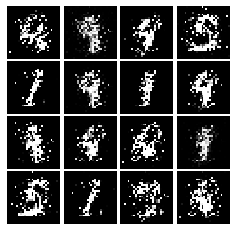

Epoch: 3, Iter: 1680, D: 0.1644, G:0.2761


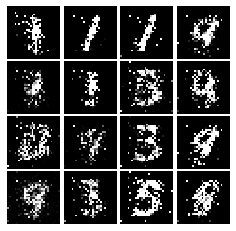

Epoch: 3, Iter: 1700, D: 0.1809, G:0.3064


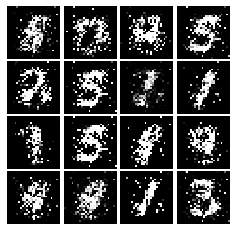

Epoch: 3, Iter: 1720, D: 0.1612, G:0.2089


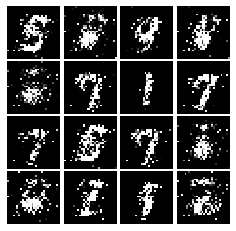

Epoch: 3, Iter: 1740, D: 0.1485, G:0.3271


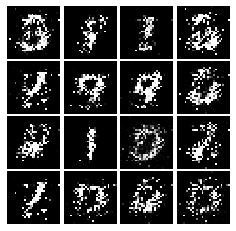

Epoch: 3, Iter: 1760, D: 0.1309, G:0.329


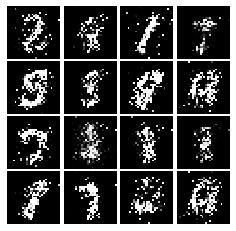

Epoch: 3, Iter: 1780, D: 0.1368, G:0.2359


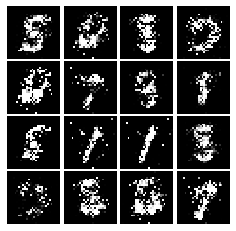

Epoch: 3, Iter: 1800, D: 0.1821, G:0.376


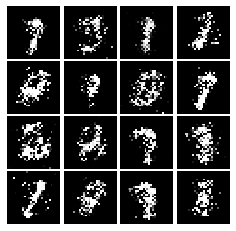

Epoch: 3, Iter: 1820, D: 0.188, G:0.248


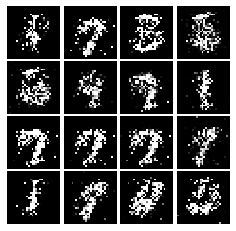

Epoch: 3, Iter: 1840, D: 0.1727, G:0.3068


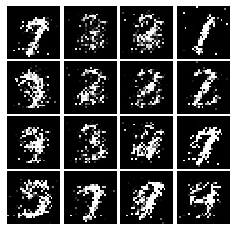

Epoch: 3, Iter: 1860, D: 0.1533, G:0.3542


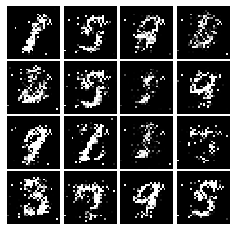

Epoch: 4, Iter: 1880, D: 0.1682, G:0.255


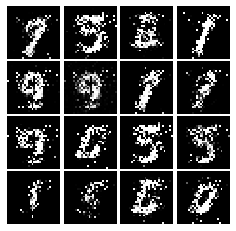

Epoch: 4, Iter: 1900, D: 0.1982, G:0.2722


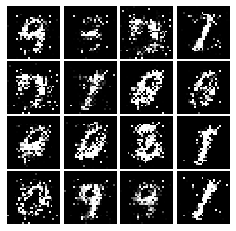

Epoch: 4, Iter: 1920, D: 0.1809, G:0.2731


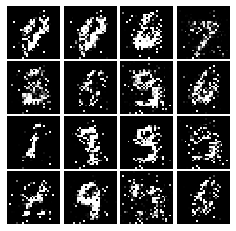

Epoch: 4, Iter: 1940, D: 0.2469, G:0.1663


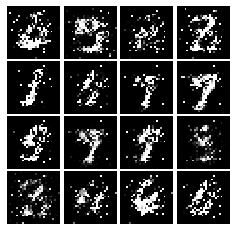

Epoch: 4, Iter: 1960, D: 0.1901, G:0.2748


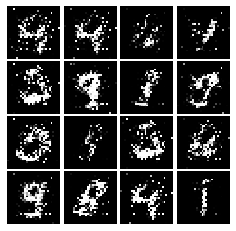

Epoch: 4, Iter: 1980, D: 0.2039, G:0.2562


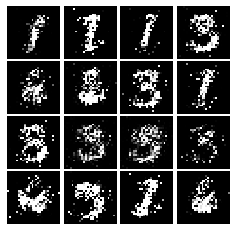

Epoch: 4, Iter: 2000, D: 0.2229, G:0.24


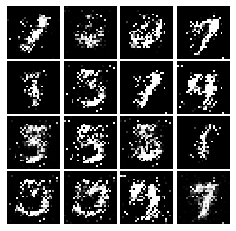

Epoch: 4, Iter: 2020, D: 0.1832, G:0.2074


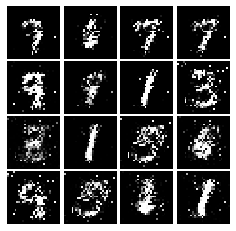

Epoch: 4, Iter: 2040, D: 0.2164, G:0.1938


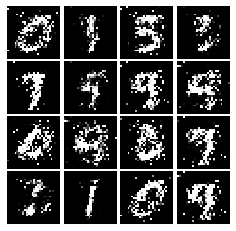

Epoch: 4, Iter: 2060, D: 0.197, G:0.2261


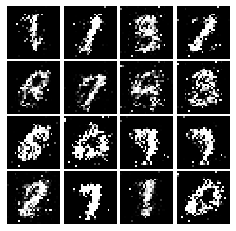

Epoch: 4, Iter: 2080, D: 0.1806, G:0.2154


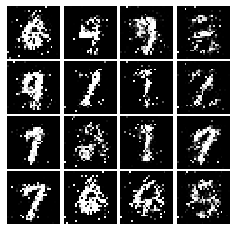

Epoch: 4, Iter: 2100, D: 0.1831, G:0.245


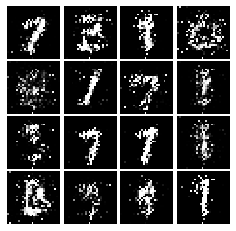

Epoch: 4, Iter: 2120, D: 0.1781, G:0.2494


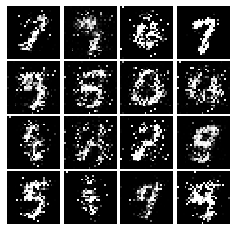

Epoch: 4, Iter: 2140, D: 0.1856, G:0.252


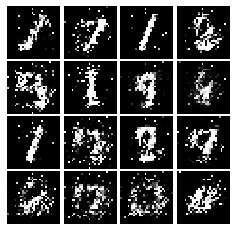

Epoch: 4, Iter: 2160, D: 0.2051, G:0.2239


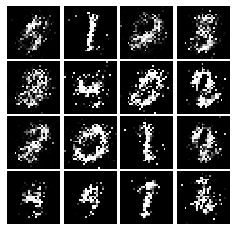

Epoch: 4, Iter: 2180, D: 1.294, G:0.226


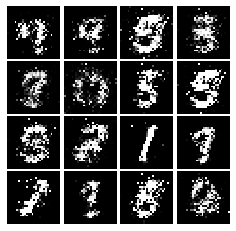

Epoch: 4, Iter: 2200, D: 0.2158, G:0.2251


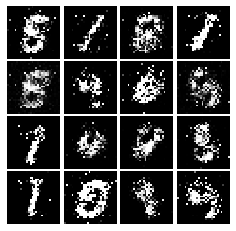

Epoch: 4, Iter: 2220, D: 0.1979, G:0.324


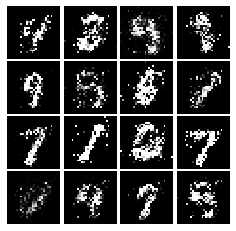

Epoch: 4, Iter: 2240, D: 0.2379, G:0.1616


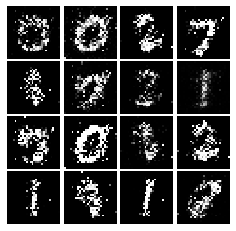

Epoch: 4, Iter: 2260, D: 0.2171, G:0.2737


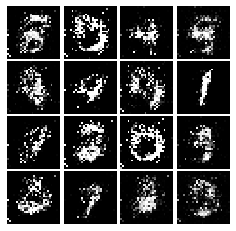

Epoch: 4, Iter: 2280, D: 0.2431, G:0.1794


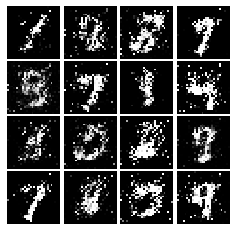

Epoch: 4, Iter: 2300, D: 0.2407, G:0.1095


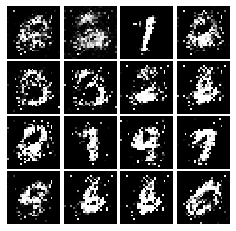

Epoch: 4, Iter: 2320, D: 0.2202, G:0.1531


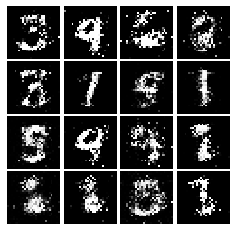

Epoch: 4, Iter: 2340, D: 0.2415, G:0.2182


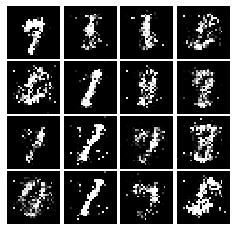

Epoch: 5, Iter: 2360, D: 0.207, G:0.194


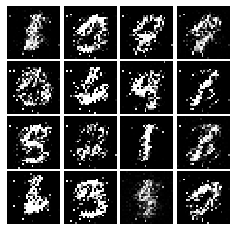

Epoch: 5, Iter: 2380, D: 0.1966, G:0.2258


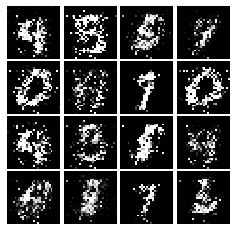

Epoch: 5, Iter: 2400, D: 0.2317, G:0.1797


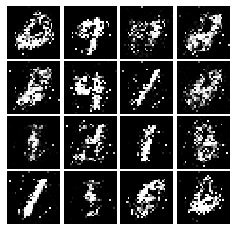

Epoch: 5, Iter: 2420, D: 0.1751, G:0.2521


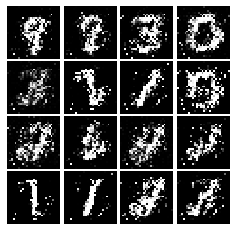

Epoch: 5, Iter: 2440, D: 0.2379, G:0.204


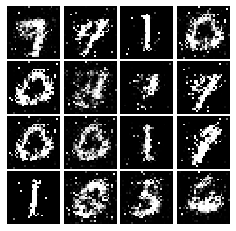

Epoch: 5, Iter: 2460, D: 0.2284, G:0.1662


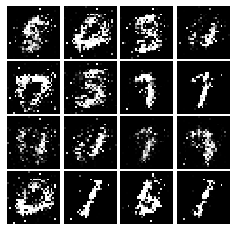

Epoch: 5, Iter: 2480, D: 0.2214, G:0.1879


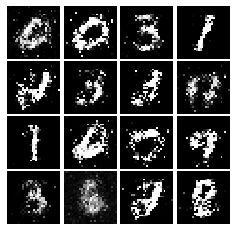

Epoch: 5, Iter: 2500, D: 0.2145, G:0.2003


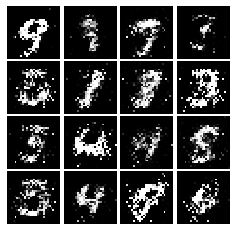

Epoch: 5, Iter: 2520, D: 0.2489, G:0.179


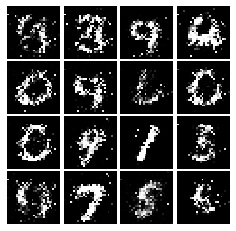

Epoch: 5, Iter: 2540, D: 0.2255, G:0.1604


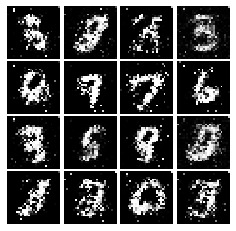

Epoch: 5, Iter: 2560, D: 0.228, G:0.1965


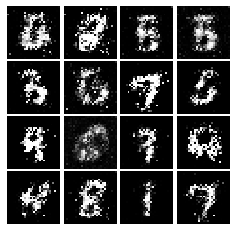

Epoch: 5, Iter: 2580, D: 0.2431, G:0.1706


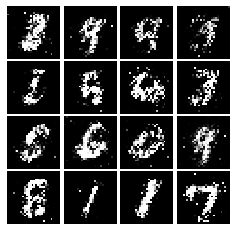

Epoch: 5, Iter: 2600, D: 0.2736, G:0.1345


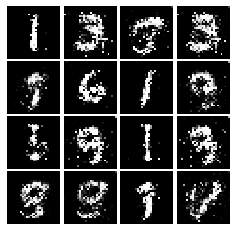

Epoch: 5, Iter: 2620, D: 0.2172, G:0.1706


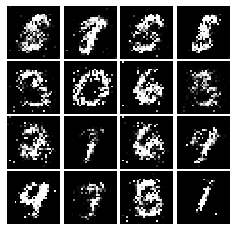

Epoch: 5, Iter: 2640, D: 0.25, G:0.1892


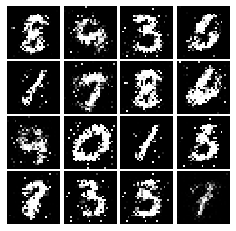

Epoch: 5, Iter: 2660, D: 0.2153, G:0.1821


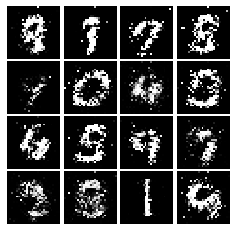

Epoch: 5, Iter: 2680, D: 0.2346, G:0.2064


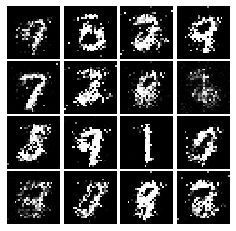

Epoch: 5, Iter: 2700, D: 0.2598, G:0.2213


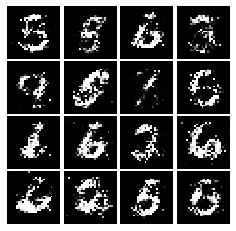

Epoch: 5, Iter: 2720, D: 0.2199, G:0.174


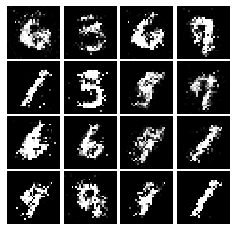

Epoch: 5, Iter: 2740, D: 0.2529, G:0.1782


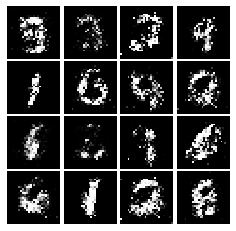

Epoch: 5, Iter: 2760, D: 0.2379, G:0.165


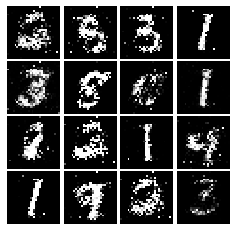

Epoch: 5, Iter: 2780, D: 0.2253, G:0.202


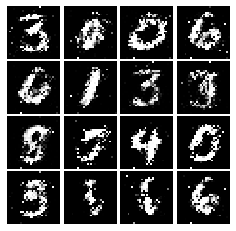

Epoch: 5, Iter: 2800, D: 0.2281, G:0.1706


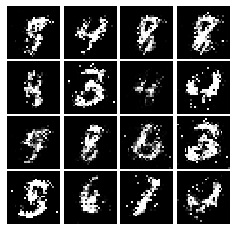

Epoch: 6, Iter: 2820, D: 0.234, G:0.1556


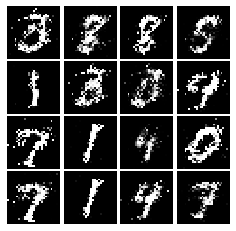

Epoch: 6, Iter: 2840, D: 0.2178, G:0.1583


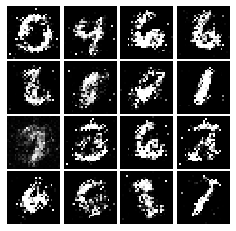

Epoch: 6, Iter: 2860, D: 0.2258, G:0.1624


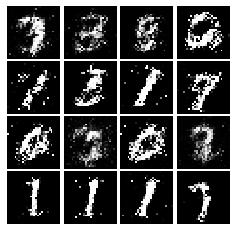

Epoch: 6, Iter: 2880, D: 0.2088, G:0.1936


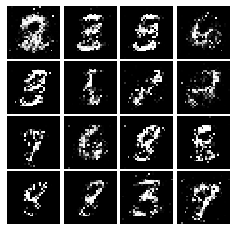

Epoch: 6, Iter: 2900, D: 0.2093, G:0.1806


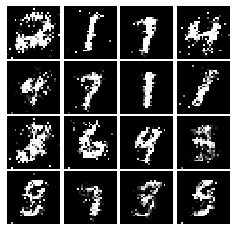

Epoch: 6, Iter: 2920, D: 0.2272, G:0.1613


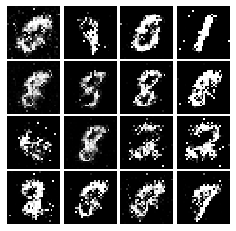

Epoch: 6, Iter: 2940, D: 0.2511, G:0.1598


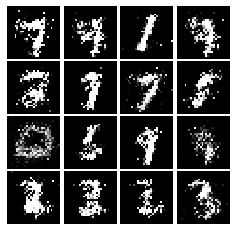

Epoch: 6, Iter: 2960, D: 0.2288, G:0.1623


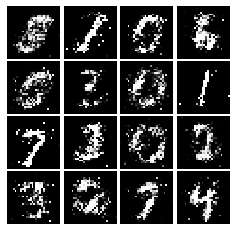

Epoch: 6, Iter: 2980, D: 0.2362, G:0.1897


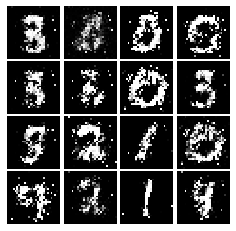

Epoch: 6, Iter: 3000, D: 0.2363, G:0.1996


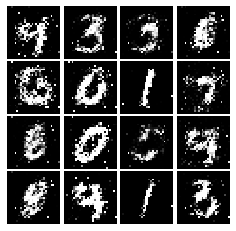

Epoch: 6, Iter: 3020, D: 0.2353, G:0.1575


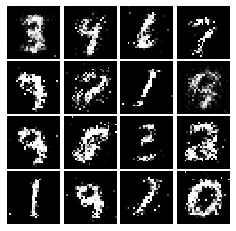

Epoch: 6, Iter: 3040, D: 0.2043, G:0.1759


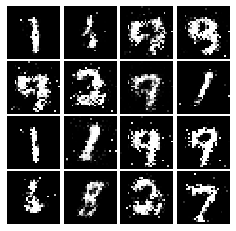

Epoch: 6, Iter: 3060, D: 0.2175, G:0.1598


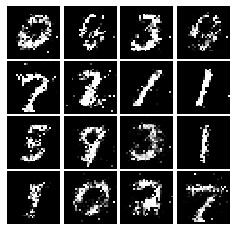

Epoch: 6, Iter: 3080, D: 0.2208, G:0.1707


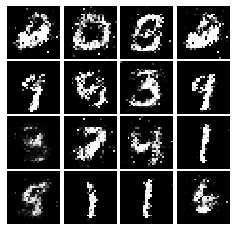

Epoch: 6, Iter: 3100, D: 0.2054, G:0.1737


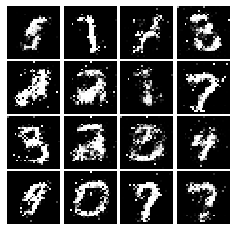

Epoch: 6, Iter: 3120, D: 0.2359, G:0.1922


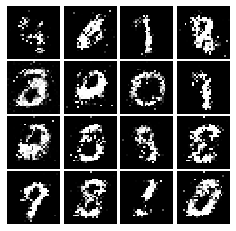

Epoch: 6, Iter: 3140, D: 0.2194, G:0.1761


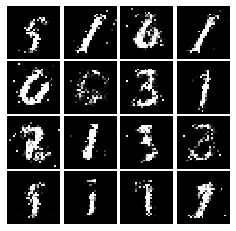

Epoch: 6, Iter: 3160, D: 0.2014, G:0.1988


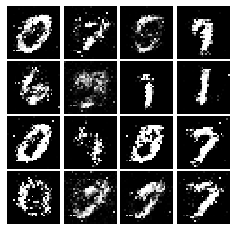

Epoch: 6, Iter: 3180, D: 0.2409, G:0.1693


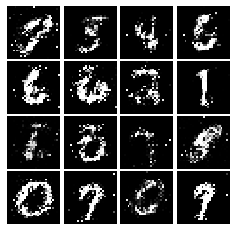

Epoch: 6, Iter: 3200, D: 0.2008, G:0.1785


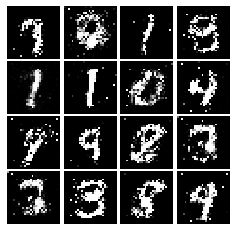

Epoch: 6, Iter: 3220, D: 0.2242, G:0.1636


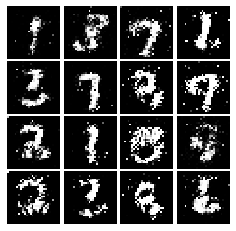

Epoch: 6, Iter: 3240, D: 0.2096, G:0.1672


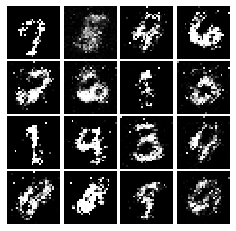

Epoch: 6, Iter: 3260, D: 0.2593, G:0.1675


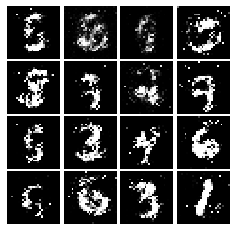

Epoch: 6, Iter: 3280, D: 0.2379, G:0.1808


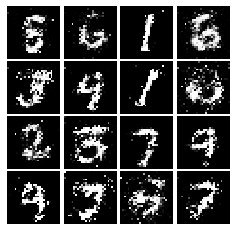

Epoch: 7, Iter: 3300, D: 0.2359, G:0.1592


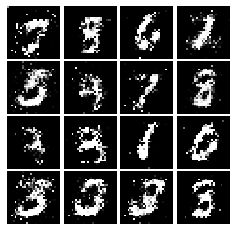

Epoch: 7, Iter: 3320, D: 0.2667, G:0.1748


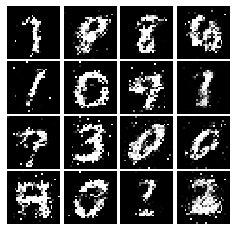

Epoch: 7, Iter: 3340, D: 0.2171, G:0.1911


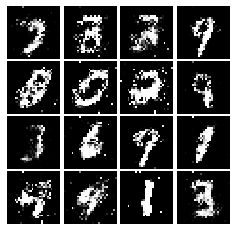

Epoch: 7, Iter: 3360, D: 0.2306, G:0.1583


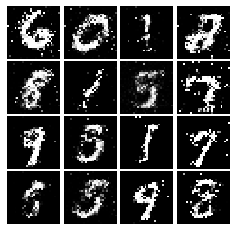

Epoch: 7, Iter: 3380, D: 0.2035, G:0.1805


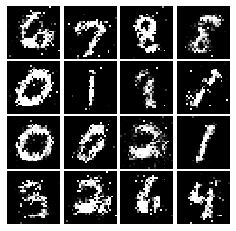

Epoch: 7, Iter: 3400, D: 0.2311, G:0.16


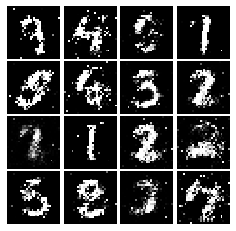

Epoch: 7, Iter: 3420, D: 0.2317, G:0.1849


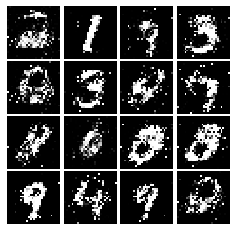

Epoch: 7, Iter: 3440, D: 0.2117, G:0.2076


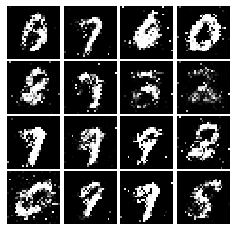

Epoch: 7, Iter: 3460, D: 0.1993, G:0.198


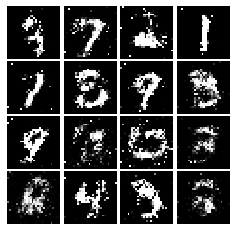

Epoch: 7, Iter: 3480, D: 0.2342, G:0.1847


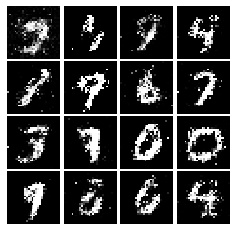

Epoch: 7, Iter: 3500, D: 0.2224, G:0.1993


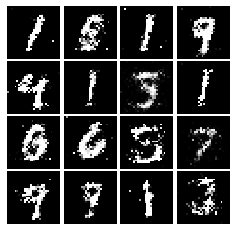

Epoch: 7, Iter: 3520, D: 0.2039, G:0.1884


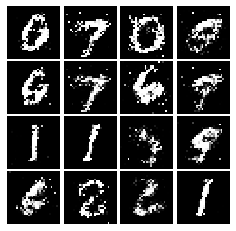

Epoch: 7, Iter: 3540, D: 0.2123, G:0.1826


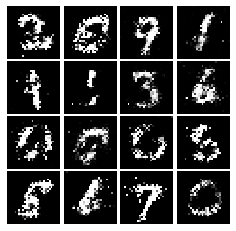

Epoch: 7, Iter: 3560, D: 0.2072, G:0.2032


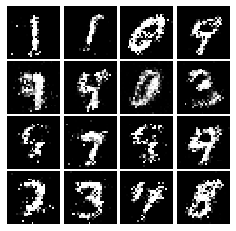

Epoch: 7, Iter: 3580, D: 0.2215, G:0.1661


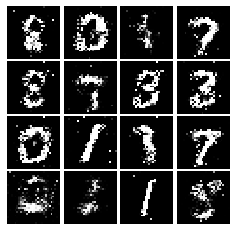

Epoch: 7, Iter: 3600, D: 0.206, G:0.1563


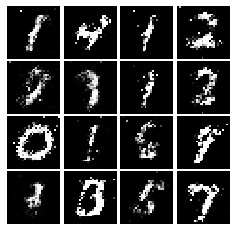

Epoch: 7, Iter: 3620, D: 0.2308, G:0.1718


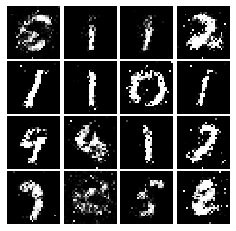

Epoch: 7, Iter: 3640, D: 0.2489, G:0.1596


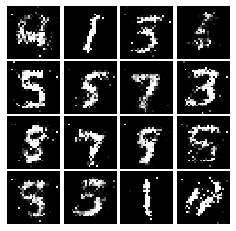

Epoch: 7, Iter: 3660, D: 0.2262, G:0.1814


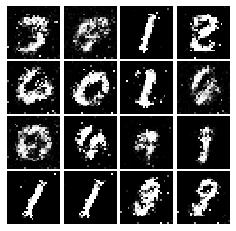

Epoch: 7, Iter: 3680, D: 0.2341, G:0.1814


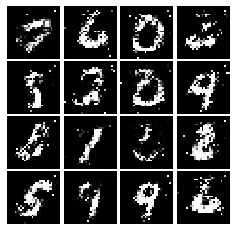

Epoch: 7, Iter: 3700, D: 0.2567, G:0.1603


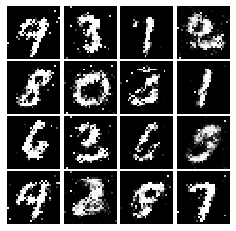

Epoch: 7, Iter: 3720, D: 0.2243, G:0.1759


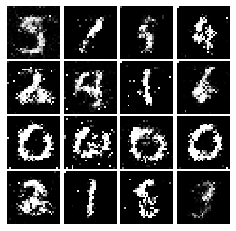

Epoch: 7, Iter: 3740, D: 0.2428, G:0.1824


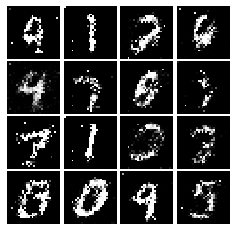

Epoch: 8, Iter: 3760, D: 0.2338, G:0.1858


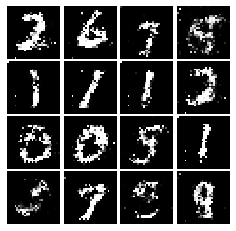

Epoch: 8, Iter: 3780, D: 0.2241, G:0.1712


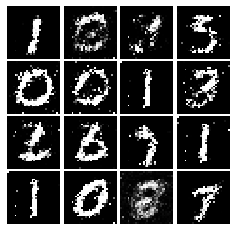

Epoch: 8, Iter: 3800, D: 0.2299, G:0.164


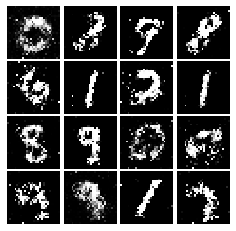

Epoch: 8, Iter: 3820, D: 0.231, G:0.2162


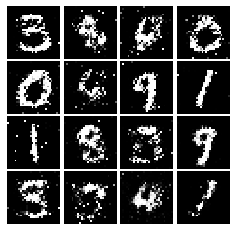

Epoch: 8, Iter: 3840, D: 0.2426, G:0.2267


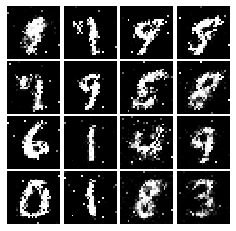

Epoch: 8, Iter: 3860, D: 0.2105, G:0.2004


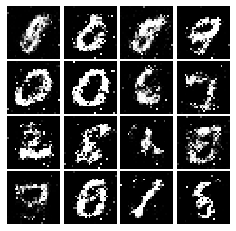

Epoch: 8, Iter: 3880, D: 0.2187, G:0.1778


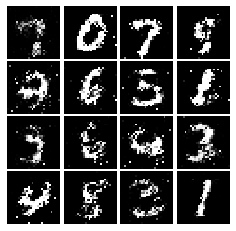

Epoch: 8, Iter: 3900, D: 0.2237, G:0.1574


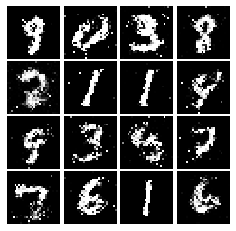

Epoch: 8, Iter: 3920, D: 0.2071, G:0.1833


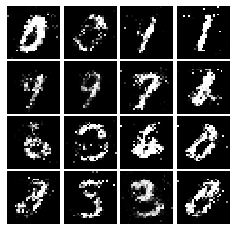

Epoch: 8, Iter: 3940, D: 0.246, G:0.1679


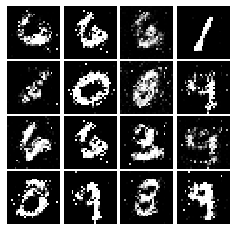

Epoch: 8, Iter: 3960, D: 0.2274, G:0.1828


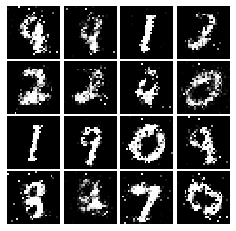

Epoch: 8, Iter: 3980, D: 0.2143, G:0.165


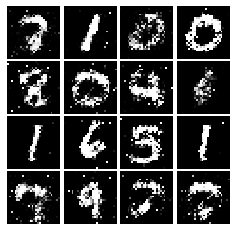

Epoch: 8, Iter: 4000, D: 0.236, G:0.1594


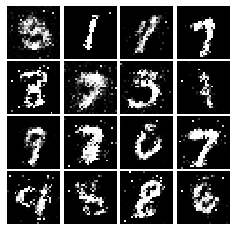

Epoch: 8, Iter: 4020, D: 0.2239, G:0.1584


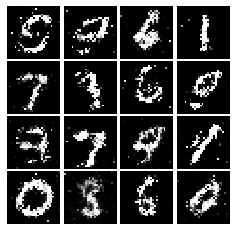

Epoch: 8, Iter: 4040, D: 0.2091, G:0.1853


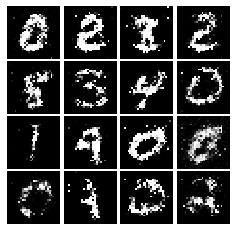

Epoch: 8, Iter: 4060, D: 0.212, G:0.1785


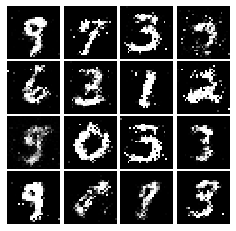

Epoch: 8, Iter: 4080, D: 0.2393, G:0.1856


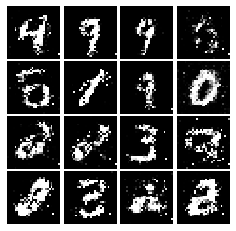

Epoch: 8, Iter: 4100, D: 0.2301, G:0.1534


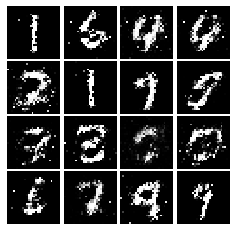

Epoch: 8, Iter: 4120, D: 0.2329, G:0.1532


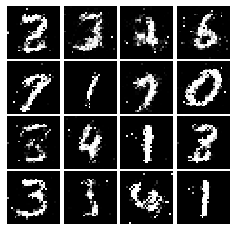

Epoch: 8, Iter: 4140, D: 0.2127, G:0.1887


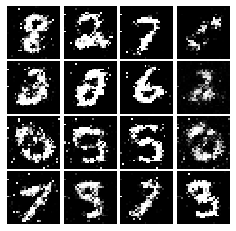

Epoch: 8, Iter: 4160, D: 0.2334, G:0.2025


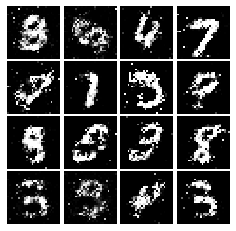

Epoch: 8, Iter: 4180, D: 0.2448, G:0.2051


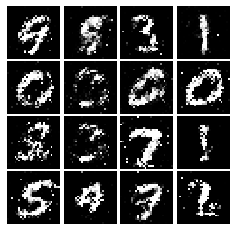

Epoch: 8, Iter: 4200, D: 0.2137, G:0.1858


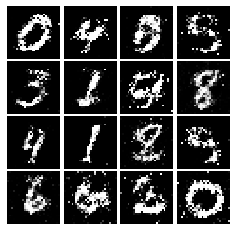

Epoch: 8, Iter: 4220, D: 0.2192, G:0.2467


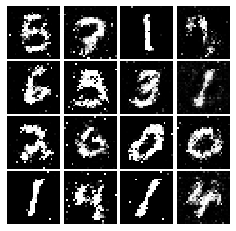

Epoch: 9, Iter: 4240, D: 0.2377, G:0.1872


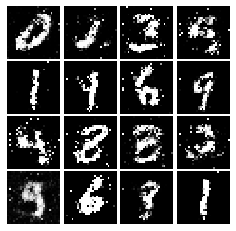

Epoch: 9, Iter: 4260, D: 0.243, G:0.1351


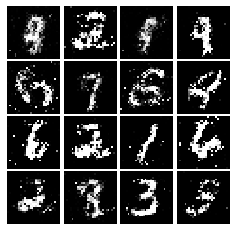

Epoch: 9, Iter: 4280, D: 0.2294, G:0.1805


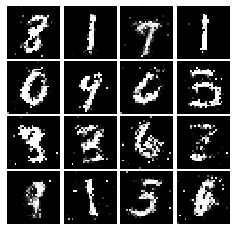

Epoch: 9, Iter: 4300, D: 0.2373, G:0.1576


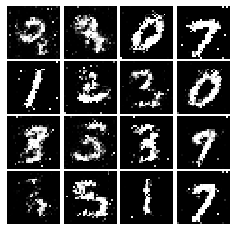

Epoch: 9, Iter: 4320, D: 0.2381, G:0.1697


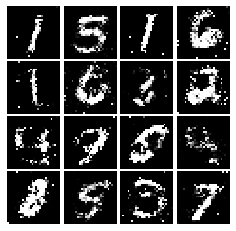

Epoch: 9, Iter: 4340, D: 0.22, G:0.1502


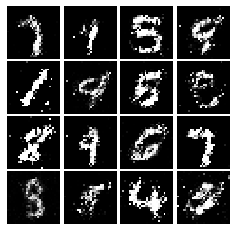

Epoch: 9, Iter: 4360, D: 0.2483, G:0.1695


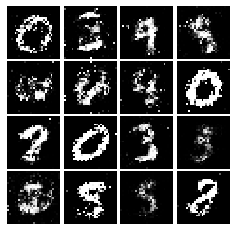

Epoch: 9, Iter: 4380, D: 0.2521, G:0.1674


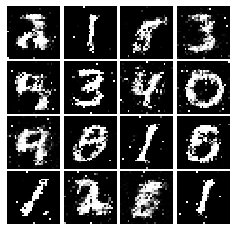

Epoch: 9, Iter: 4400, D: 0.2124, G:0.2168


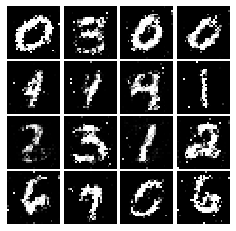

Epoch: 9, Iter: 4420, D: 0.2289, G:0.1802


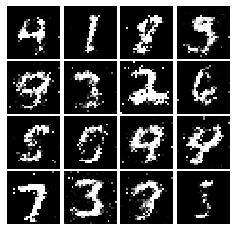

Epoch: 9, Iter: 4440, D: 0.2543, G:0.1337


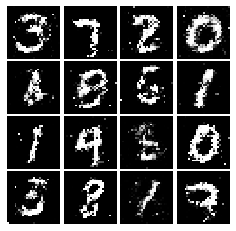

Epoch: 9, Iter: 4460, D: 0.239, G:0.1698


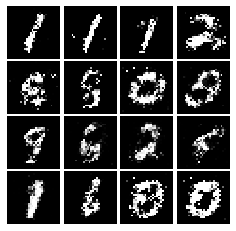

Epoch: 9, Iter: 4480, D: 0.246, G:0.1689


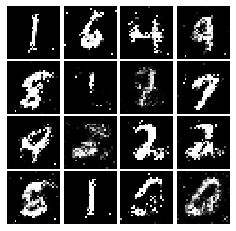

Epoch: 9, Iter: 4500, D: 0.2627, G:0.1767


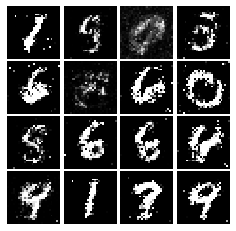

Epoch: 9, Iter: 4520, D: 0.2307, G:0.1739


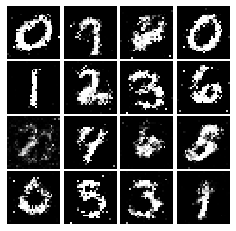

Epoch: 9, Iter: 4540, D: 0.2353, G:0.1706


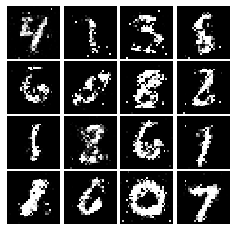

Epoch: 9, Iter: 4560, D: 0.2246, G:0.1803


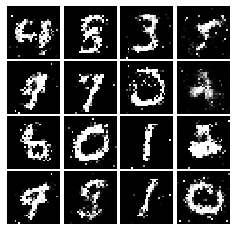

Epoch: 9, Iter: 4580, D: 0.2396, G:0.1847


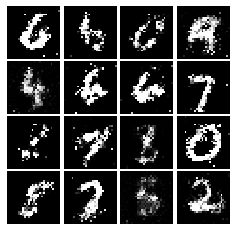

Epoch: 9, Iter: 4600, D: 0.2391, G:0.1545


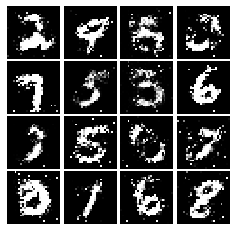

Epoch: 9, Iter: 4620, D: 0.2247, G:0.1552


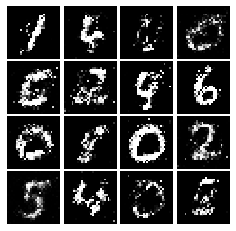

Epoch: 9, Iter: 4640, D: 0.2218, G:0.1595


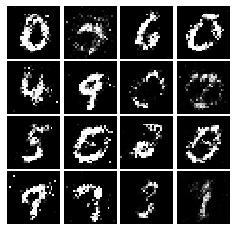

Epoch: 9, Iter: 4660, D: 0.2022, G:0.1675


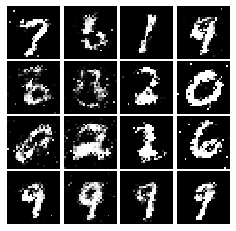

Epoch: 9, Iter: 4680, D: 0.22, G:0.2068


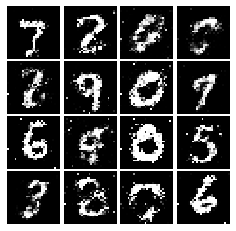

Final images


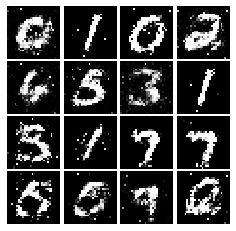

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [37]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Reshape((28,28,1),input_shape=(784,)),
        tf.keras.layers.Conv2D(32, (5,5), strides=1, padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2), strides=(2,2)),
        tf.keras.layers.Conv2D(64, (5,5), strides=1, padding='VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2), strides=(2,2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [38]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.Dense(1024,input_shape=(noise_dim,)),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(64,(4,4),strides=(2,2),padding="SAME"),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1,(4,4),strides=(2,2),padding="SAME",activation=tf.nn.tanh)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.385, G:0.6609


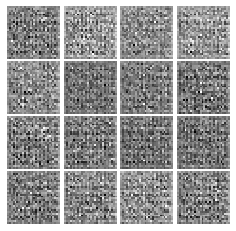

Epoch: 0, Iter: 20, D: 0.4011, G:1.301


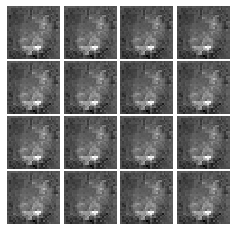

Epoch: 0, Iter: 40, D: 16.23, G:3.797


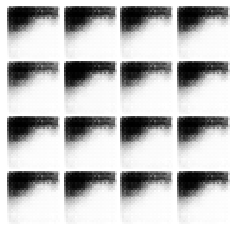

Epoch: 0, Iter: 60, D: 3.519, G:3.156


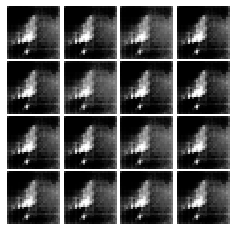

Epoch: 0, Iter: 80, D: 0.08199, G:3.736


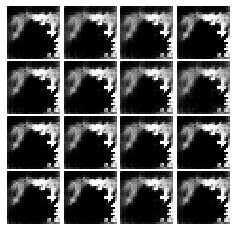

Epoch: 0, Iter: 100, D: 2.25, G:4.783


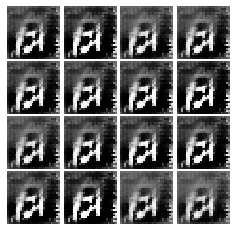

Epoch: 0, Iter: 120, D: 0.5852, G:2.395


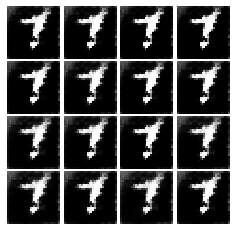

Epoch: 0, Iter: 140, D: 2.047, G:3.719


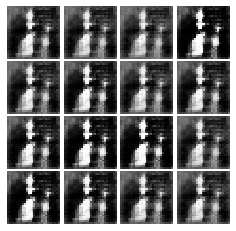

Epoch: 0, Iter: 160, D: 0.6437, G:2.667


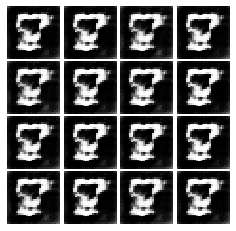

Epoch: 0, Iter: 180, D: 3.664, G:3.361


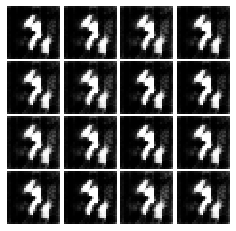

Epoch: 0, Iter: 200, D: 0.8813, G:3.303


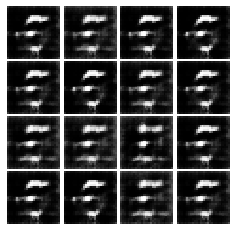

Epoch: 0, Iter: 220, D: 0.2091, G:3.016


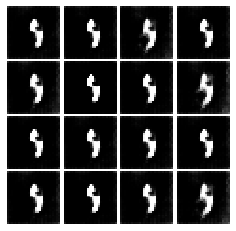

Epoch: 0, Iter: 240, D: 1.063, G:1.975


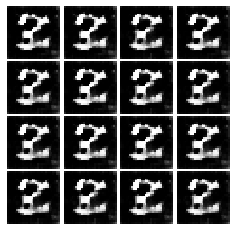

Epoch: 0, Iter: 260, D: 2.264, G:7.051


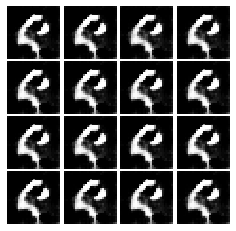

Epoch: 0, Iter: 280, D: 0.7891, G:2.966


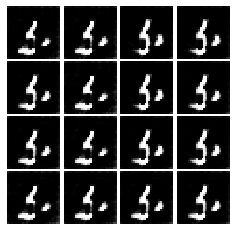

Epoch: 0, Iter: 300, D: 3.191, G:9.007


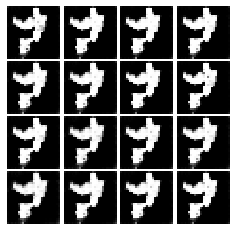

Epoch: 0, Iter: 320, D: 0.2186, G:5.994


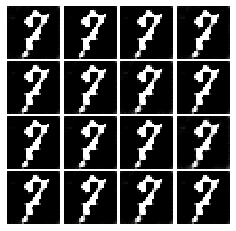

Epoch: 0, Iter: 340, D: 2.055, G:2.273


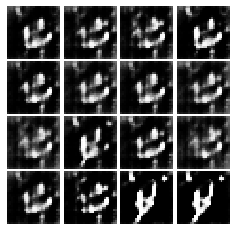

Epoch: 0, Iter: 360, D: 1.618, G:4.135


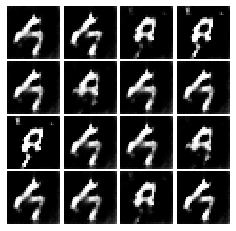

Epoch: 0, Iter: 380, D: 0.7693, G:1.997


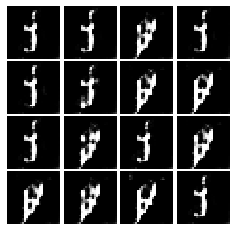

Epoch: 0, Iter: 400, D: 0.424, G:2.128


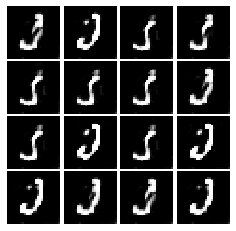

Epoch: 0, Iter: 420, D: 0.2284, G:2.726


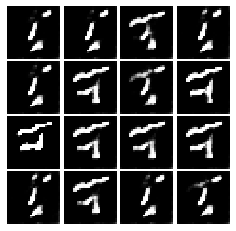

Epoch: 0, Iter: 440, D: 0.3617, G:3.247


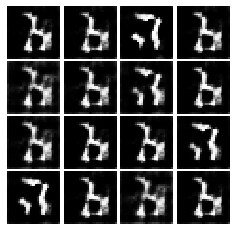

Epoch: 0, Iter: 460, D: 0.9522, G:1.31


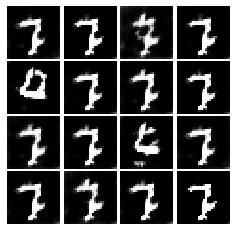

Epoch: 1, Iter: 480, D: 0.3567, G:2.518


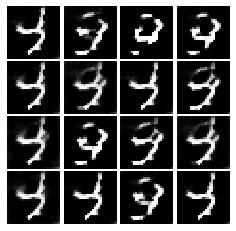

Epoch: 1, Iter: 500, D: 0.4983, G:2.082


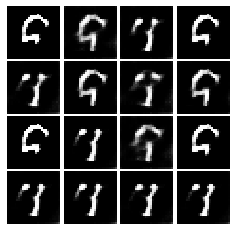

Epoch: 1, Iter: 520, D: 0.3874, G:2.703


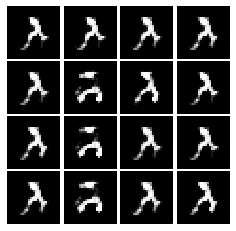

Epoch: 1, Iter: 540, D: 3.087, G:4.769


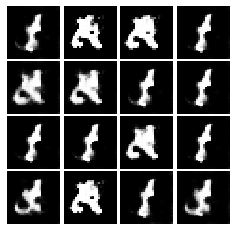

Epoch: 1, Iter: 560, D: 1.256, G:5.035


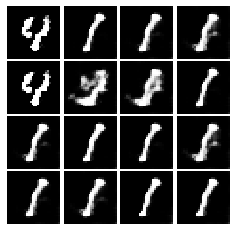

Epoch: 1, Iter: 580, D: 0.6026, G:2.668


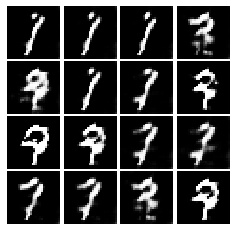

Epoch: 1, Iter: 600, D: 0.6936, G:3.938


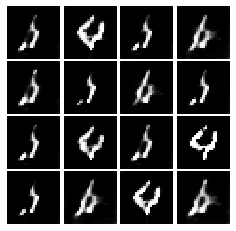

Epoch: 1, Iter: 620, D: 0.2585, G:2.988


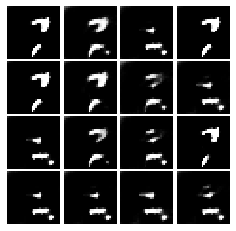

Epoch: 1, Iter: 640, D: 0.04997, G:4.527


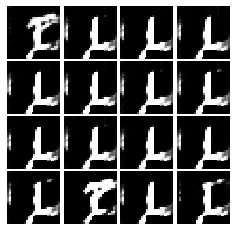

Epoch: 1, Iter: 660, D: 0.1782, G:3.766


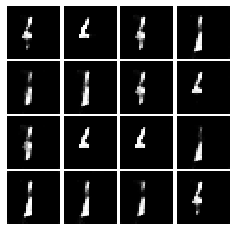

Epoch: 1, Iter: 680, D: 0.4952, G:2.565


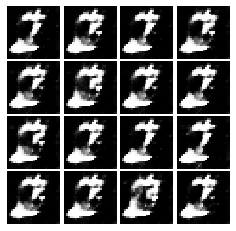

Epoch: 1, Iter: 700, D: 0.4849, G:2.981


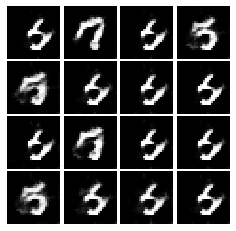

Epoch: 1, Iter: 720, D: 0.8699, G:0.5137


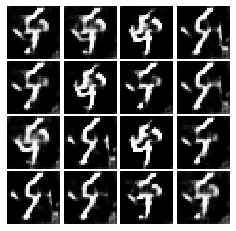

Epoch: 1, Iter: 740, D: 0.8893, G:1.8


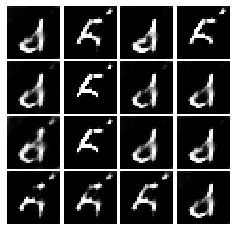

Epoch: 1, Iter: 760, D: 0.4537, G:3.126


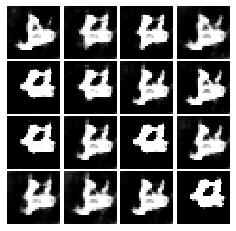

Epoch: 1, Iter: 780, D: 0.4201, G:4.124


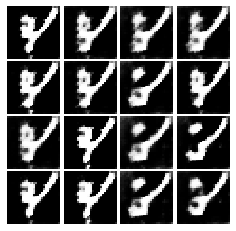

Epoch: 1, Iter: 800, D: 0.4858, G:4.509


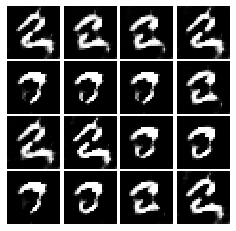

Epoch: 1, Iter: 820, D: 0.7853, G:3.654


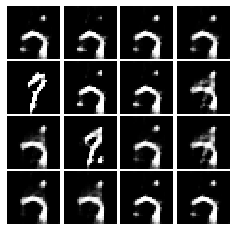

Epoch: 1, Iter: 840, D: 0.3834, G:2.753


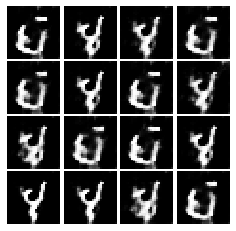

Epoch: 1, Iter: 860, D: 0.4546, G:3.28


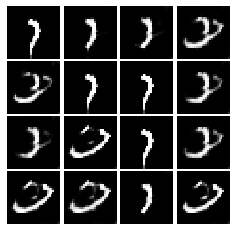

Epoch: 1, Iter: 880, D: 0.2337, G:3.078


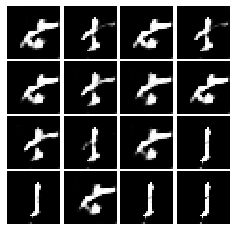

Epoch: 1, Iter: 900, D: 0.1513, G:3.396


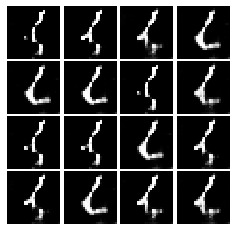

Epoch: 1, Iter: 920, D: 0.7321, G:5.003


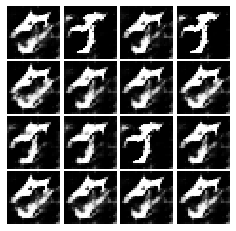

Epoch: 2, Iter: 940, D: 0.3098, G:2.947


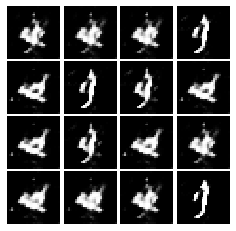

Epoch: 2, Iter: 960, D: 0.4453, G:3.896


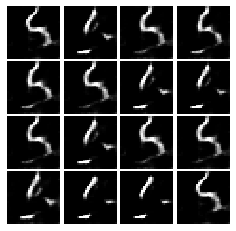

Epoch: 2, Iter: 980, D: 0.3404, G:3.25


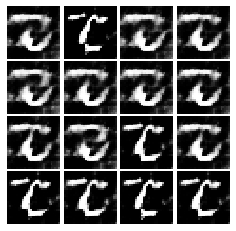

Epoch: 2, Iter: 1000, D: 0.8469, G:2.448


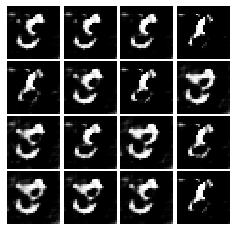

Epoch: 2, Iter: 1020, D: 0.398, G:2.123


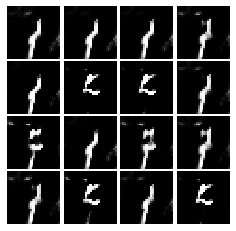

Epoch: 2, Iter: 1040, D: 0.7599, G:6.262


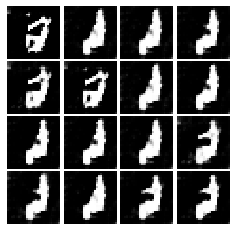

Epoch: 2, Iter: 1060, D: 0.3792, G:5.821


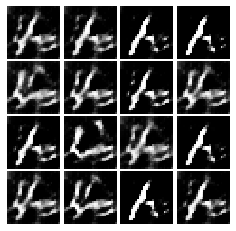

Epoch: 2, Iter: 1080, D: 0.8864, G:2.65


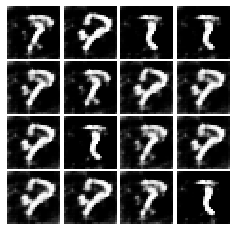

Epoch: 2, Iter: 1100, D: 1.104, G:5.561


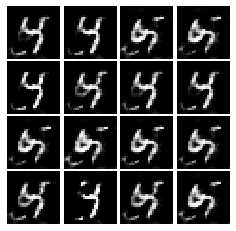

Epoch: 2, Iter: 1120, D: 0.5831, G:3.1


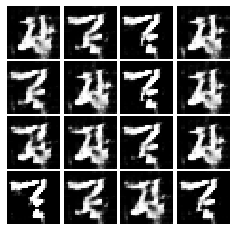

Epoch: 2, Iter: 1140, D: 0.5281, G:4.126


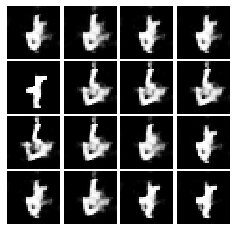

Epoch: 2, Iter: 1160, D: 0.7072, G:2.674


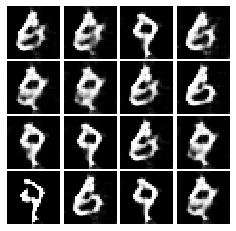

Epoch: 2, Iter: 1180, D: 0.4682, G:3.785


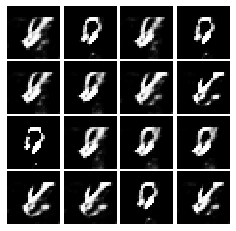

Epoch: 2, Iter: 1200, D: 0.2648, G:3.384


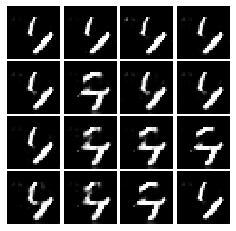

Epoch: 2, Iter: 1220, D: 0.6805, G:2.809


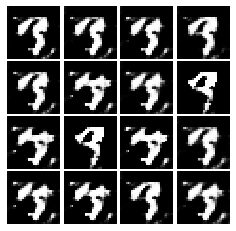

Epoch: 2, Iter: 1240, D: 0.09736, G:3.807


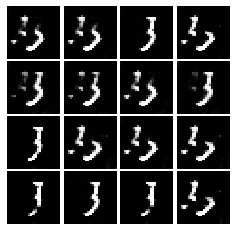

Epoch: 2, Iter: 1260, D: 0.5558, G:2.358


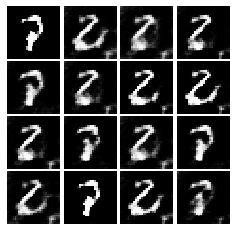

Epoch: 2, Iter: 1280, D: 0.1844, G:3.21


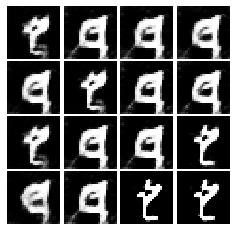

Epoch: 2, Iter: 1300, D: 0.203, G:3.915


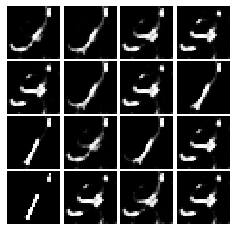

Epoch: 2, Iter: 1320, D: 1.243, G:3.932


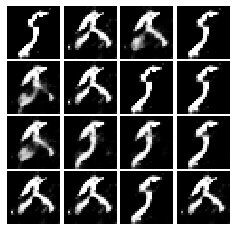

Epoch: 2, Iter: 1340, D: 0.4852, G:4.275


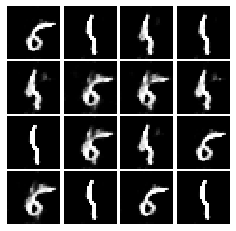

Epoch: 2, Iter: 1360, D: 1.008, G:1.907


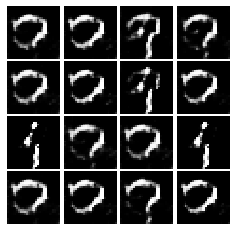

Epoch: 2, Iter: 1380, D: 0.6019, G:3.09


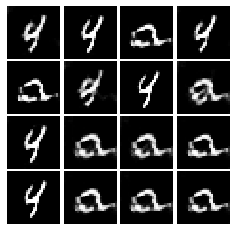

Epoch: 2, Iter: 1400, D: 0.1832, G:3.132


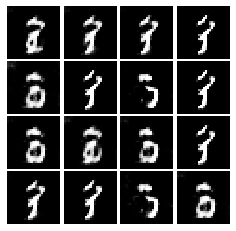

Epoch: 3, Iter: 1420, D: 0.1974, G:3.162


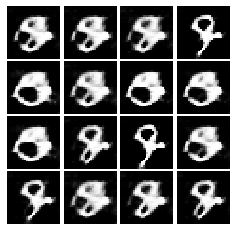

Epoch: 3, Iter: 1440, D: 0.4782, G:3.873


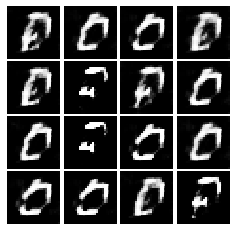

Epoch: 3, Iter: 1460, D: 0.5003, G:3.256


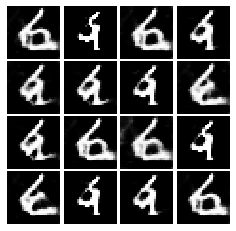

Epoch: 3, Iter: 1480, D: 0.6012, G:1.832


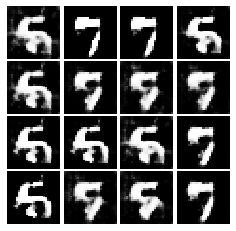

Epoch: 3, Iter: 1500, D: 0.1603, G:4.907


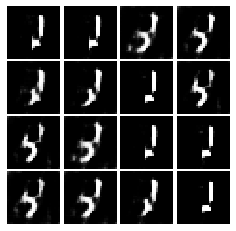

Epoch: 3, Iter: 1520, D: 0.2178, G:3.192


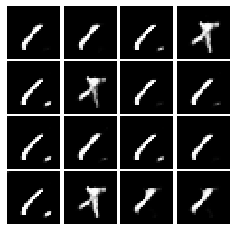

Epoch: 3, Iter: 1540, D: 0.4393, G:4.722


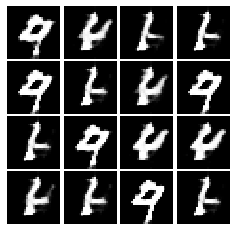

Epoch: 3, Iter: 1560, D: 0.4153, G:3.364


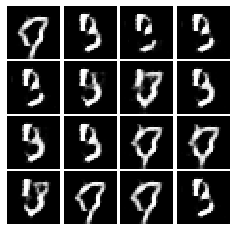

Epoch: 3, Iter: 1580, D: 0.4946, G:3.094


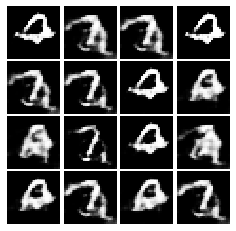

Epoch: 3, Iter: 1600, D: 0.8868, G:3.386


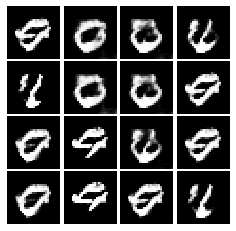

Epoch: 3, Iter: 1620, D: 0.3356, G:4.305


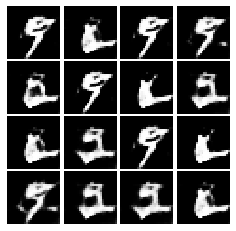

Epoch: 3, Iter: 1640, D: 0.7646, G:3.217


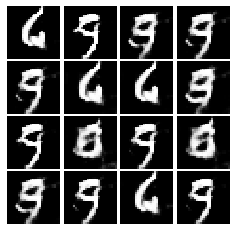

Epoch: 3, Iter: 1660, D: 0.1129, G:3.22


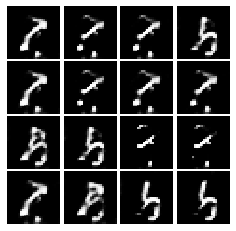

Epoch: 3, Iter: 1680, D: 0.2486, G:3.803


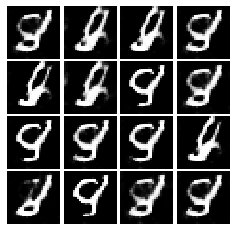

Epoch: 3, Iter: 1700, D: 0.5197, G:4.624


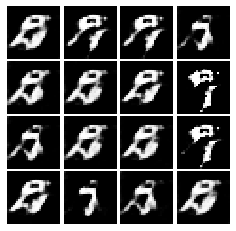

Epoch: 3, Iter: 1720, D: 0.4495, G:2.149


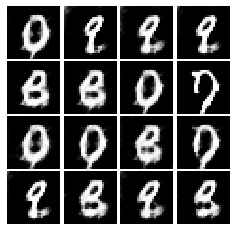

Epoch: 3, Iter: 1740, D: 0.4455, G:2.858


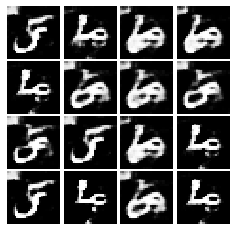

Epoch: 3, Iter: 1760, D: 1.688, G:5.917


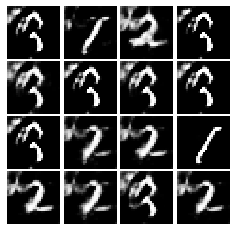

Epoch: 3, Iter: 1780, D: 0.1418, G:4.569


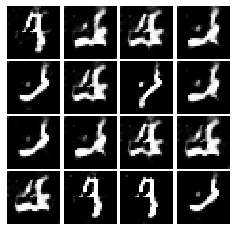

Epoch: 3, Iter: 1800, D: 0.541, G:3.185


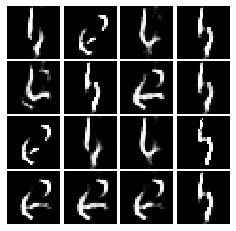

Epoch: 3, Iter: 1820, D: 0.4326, G:2.876


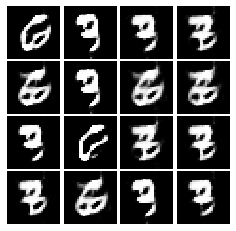

Epoch: 3, Iter: 1840, D: 0.1758, G:3.553


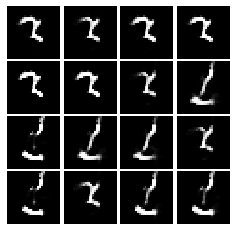

Epoch: 3, Iter: 1860, D: 0.2353, G:3.887


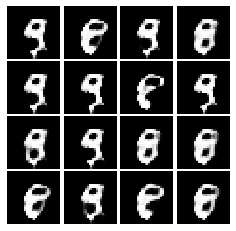

Epoch: 4, Iter: 1880, D: 0.2407, G:3.61


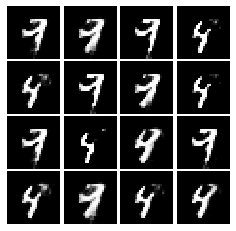

Epoch: 4, Iter: 1900, D: 0.3218, G:3.804


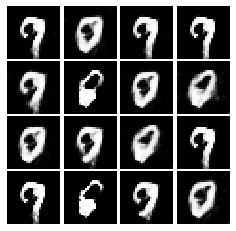

Epoch: 4, Iter: 1920, D: 0.1204, G:4.363


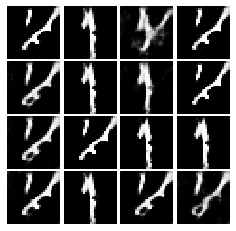

Epoch: 4, Iter: 1940, D: 0.1975, G:4.249


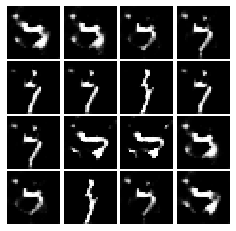

Epoch: 4, Iter: 1960, D: 0.7215, G:6.877


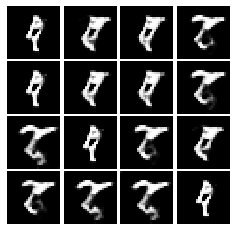

Epoch: 4, Iter: 1980, D: 0.2814, G:3.591


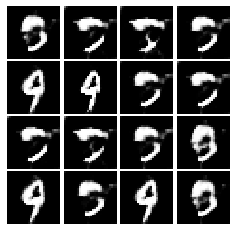

Epoch: 4, Iter: 2000, D: 0.4781, G:3.239


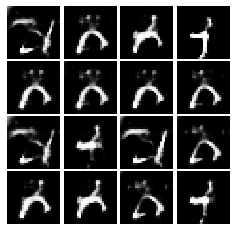

Epoch: 4, Iter: 2020, D: 0.2194, G:3.603


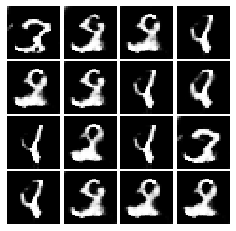

Epoch: 4, Iter: 2040, D: 0.4562, G:3.815


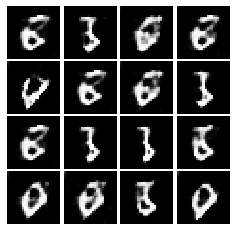

Epoch: 4, Iter: 2060, D: 0.4974, G:3.223


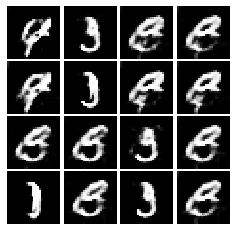

Epoch: 4, Iter: 2080, D: 0.6908, G:8.123


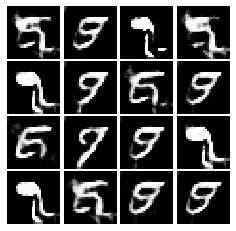

Epoch: 4, Iter: 2100, D: 0.412, G:4.904


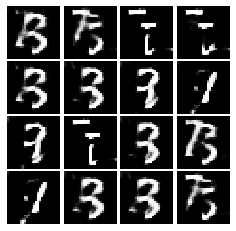

Epoch: 4, Iter: 2120, D: 0.7724, G:2.7


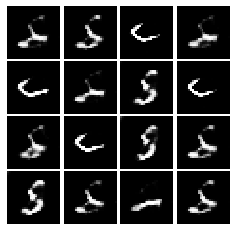

Epoch: 4, Iter: 2140, D: 0.2849, G:4.315


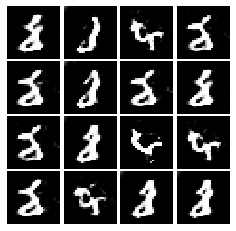

Epoch: 4, Iter: 2160, D: 0.505, G:3.271


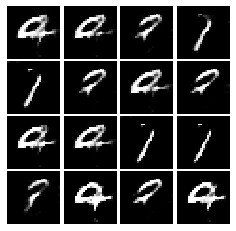

Epoch: 4, Iter: 2180, D: 0.2403, G:3.222


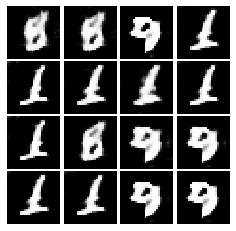

Epoch: 4, Iter: 2200, D: 0.2075, G:3.632


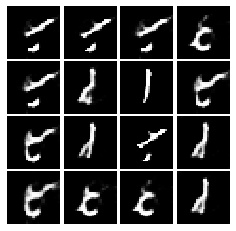

Epoch: 4, Iter: 2220, D: 0.1066, G:4.439


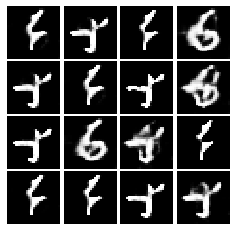

Epoch: 4, Iter: 2240, D: 0.2667, G:2.917


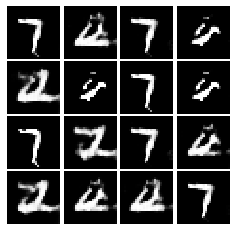

Epoch: 4, Iter: 2260, D: 0.5498, G:4.16


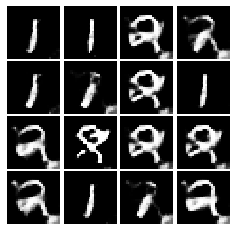

Epoch: 4, Iter: 2280, D: 0.548, G:3.323


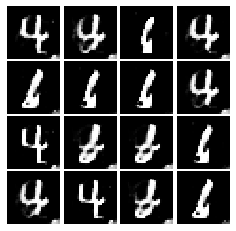

Epoch: 4, Iter: 2300, D: 0.843, G:2.108


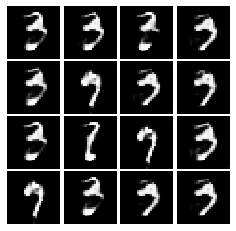

Epoch: 4, Iter: 2320, D: 0.4156, G:4.754


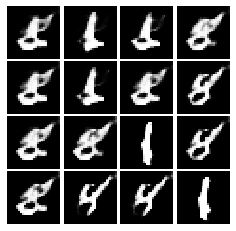

Epoch: 4, Iter: 2340, D: 0.3549, G:4.451


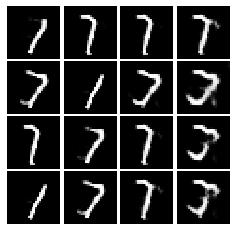

Final images


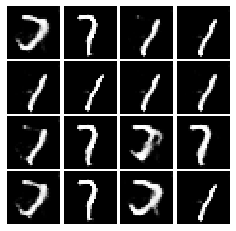

In [39]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |   2   |   1   
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
